## Import packages, mount and access data

In [1]:
!pip install nba_api

# Import packages and mount drive
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np
import sklearn as sk
import seaborn as sns
import requests
import warnings

from nba_api.stats.endpoints import leaguegamefinder
from nba_api.stats.static import teams

warnings.filterwarnings('ignore')
drive.mount("/content/drive")

# Validate the file location
!ls "/content/drive/MyDrive/Advanced Sports Analytics - DSO 579 Project"

# Adjust pandas settings to display all columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 279.4/279.4 kB 1.8 MB/s eta 0:00:00
Mounted at /content/drive
 2023_nba_player_stats.csv
 3_man.csv
 5_man.csv
'DSO 579-Final Project Paper.gdoc'
'DSO 579 NBA 5-Man Lineups.gslides'
'DSO 579 NBA Win Prediction.ipynb'
 lineups_data.xlsx
'LV Raiders - Jonathan Meeting Notes 11 11 24.gdoc'
 manual_lineups.xlsx
'Match_up_and_date (1).gsheet'
 Match_up_and_date.csv
 Match_up_and_date.gsheet
 merged_data.xlsx
'NBA 23-24 Season Data.gsheet'
'NBA 23-24 Season Data - Lakers.csv'
 nba_3-man_dummy_lineups.ipynb
 nba_3-man_dummy_player.ipynb
'nba 5-man DEF.ipynb'
 nba_5-man_dummy_lineups.ipynb
'nba_5-man_dummy player.ipynb'
'nba 5-man no dummy.ipynb'
 nba_lineups.ipynb
'NBA Player Performance Win Prediction Proposal.gdoc'
'NBA Players Dataset 2023.zip'
'Play making nba 5-man.ipynb'
'Slide Templates'
 X_final_output.xlsx


## Accessing Scraped 3-man Data

In [2]:
df_dates = pd.read_csv("/content/drive/MyDrive/Advanced Sports Analytics - DSO 579 Project/Match_up_and_date.csv")
df_dates = df_dates.sort_values(by='GAME DATE', ascending= True)
df_dates.head()

,MATCH UP,GAME DATE,W/L
81,LAL @ DEN,2023-10-24,0
80,LAL vs. PHX,2023-10-26,1
79,LAL @ SAC,2023-10-29,0
78,LAL vs. ORL,2023-10-30,1
77,LAL vs. LAC,2023-11-01,1


In [3]:
file_path = "/content/drive/MyDrive/Advanced Sports Analytics - DSO 579 Project/3_man.csv"
data = pd.read_csv(file_path)
data.head()

,LINEUPS,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,DATE
0,A. Davis - T. Prince - A. Reaves,LAL,1.0,28.0,105.3,132.2,-26.9,61.9,1.63,16.3,30.3,67.9,47.5,0.1,46.2,50.8,100.26,35.4,10/24/2023
1,D. Russell - T. Prince - A. Reaves,LAL,1.0,21.0,117.4,122.2,-4.8,63.2,3.00,18.8,27.3,68.0,48.9,0.1,56.4,59.8,105.17,48.6,10/24/2023
2,A. Davis - D. Russell - A. Reaves,LAL,1.0,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,10/24/2023
3,A. Davis - D. Russell - T. Prince,LAL,1.0,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,10/24/2023
4,L. James - A. Davis - D. Russell,LAL,1.0,18.0,125.6,120.5,5.1,64.7,3.67,20.8,16.7,72.2,44.4,0.1,63.6,65.5,103.62,48.7,10/24/2023


In [ ]:
# Ensure DATE format matches between the two dataframes
df_dates['GAME DATE'] = pd.to_datetime(df_dates['GAME DATE'])
data['DATE'] = pd.to_datetime(data['DATE'])

# Extract only the opposing team's name from the MATCH UP column
df_dates['OPPOSING TEAM'] = df_dates['MATCH UP'].str.split(' ').str[-1]

# Merge the dataframes on the DATE columns
combined_df = pd.merge(
    data,
    df_dates[['GAME DATE', 'OPPOSING TEAM', 'W/L']],  # Include relevant columns
    left_on='DATE',
    right_on='GAME DATE',
    how='left'
)

# Drop unnecessary GAME DATE column if needed
combined_df.drop(columns=['GAME DATE'], inplace=True)

# Print the combined DataFrame
combined_df

,LINEUPS,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,DATE,OPPOSING TEAM,W/L
0,A. Davis - T. Prince - A. Reaves,LAL,1.0,28.0,105.3,132.2,-26.9,61.9,1.63,16.3,30.3,67.9,47.5,0.1,46.2,50.8,100.26,35.4,2023-10-24,DEN,0
1,D. Russell - T. Prince - A. Reaves,LAL,1.0,21.0,117.4,122.2,-4.8,63.2,3.00,18.8,27.3,68.0,48.9,0.1,56.4,59.8,105.17,48.6,2023-10-24,DEN,0
2,A. Davis - D. Russell - A. Reaves,LAL,1.0,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,2023-10-24,DEN,0
3,A. Davis - D. Russell - T. Prince,LAL,1.0,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,2023-10-24,DEN,0
4,L. James - A. Davis - D. Russell,LAL,1.0,18.0,125.6,120.5,5.1,64.7,3.67,20.8,16.7,72.2,44.4,0.1,63.6,65.5,103.62,48.7,2023-10-24,DEN,0
5,L. James - D. Russell - A. Reaves,LAL,1.0,18.0,114.6,115.0,-0.4,64.7,3.67,19.3,23.8,71.4,47.6,0.1,55.6,58.2,107.50,48.5,2023-10-24,DEN,0
6,L. James - D. Russell - T. Prince,LAL,1.0,18.0,114.6,115.0,-0.4,64.7,3.67,19.3,23.8,71.4,47.6,0.1,55.6,58.2,107.50,48.5,2023-10-24,DEN,0
7,L. James - T. Prince - A. Reaves,LAL,1.0,18.0,114.6,115.0,-0.4,64.7,3.67,19.3,23.8,71.4,47.6,0.1,55.6,58.2,107.50,48.5,2023-10-24,DEN,0
8,L. James - A. Davis - A. Reaves,LAL,1.0,16.0,119.4,131.4,-12.0,60.0,3.00,18.8,17.6,68.8,42.4,0.1,60.0,62.5,103.48,44.2,2023-10-24,DEN,0
9,L. James - A. Davis - T. Prince,LAL,1.0,16.0,117.1,129.4,-12.3,64.3,3.00,19.1,17.6,68.8,42.4,0.1,58.6,61.4,103.72,44.1,2023-10-24,DEN,0


In [ ]:
# Identify rows with any NaN values
rows_with_nan = combined_df[combined_df.isnull().any(axis=1)]

# Display the rows with NaN
rows_with_nan

,LINEUPS,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,DATE,OPPOSING TEAM,W/L
140,A. Davis - C. Wood - T. Prince,LAL,1.0,2.0,33.3,150.0,-116.7,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.33,-114.3,2023-10-26,PHX,1
141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118.36,35.3,2023-10-26,PHX,1
142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,150.97,-28.6,2023-10-26,PHX,1
143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.95,0.0,2023-10-26,PHX,1
144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.95,0.0,2023-10-26,PHX,1
145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.33,-114.3,2023-10-26,PHX,1
146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.33,-114.3,2023-10-26,PHX,1
147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.33,-114.3,2023-10-26,PHX,1
148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,140.49,22.2,2023-10-26,PHX,1
149,NaN,NaN,1.0,1.0,100.0,100.0,0.0,100.0,0.0,33.3,0.0,100.0,50.0,0.0,50.0,50.0,90.00,50.0,2023-10-26,PHX,1


In [ ]:
# Drop rows with any NaN values
combined_df = combined_df.dropna()

# Display the updated DataFrame
nan_row_check_post_clean = combined_df[combined_df.isnull().any(axis=1)]
nan_row_check_post_clean

,LINEUPS,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,DATE,OPPOSING TEAM,W/L


In [ ]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5515 entries, 0 to 5532
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   LINEUPS        5515 non-null   object        
 1   TEAM           5515 non-null   object        
 2   GP             5515 non-null   float64       
 3   MIN            5515 non-null   float64       
 4   OFFRTG         5515 non-null   float64       
 5   DEFRTG         5515 non-null   float64       
 6   NETRTG         5515 non-null   float64       
 7   AST%           5515 non-null   float64       
 8   AST/TO         5515 non-null   float64       
 9   AST RATIO      5515 non-null   float64       
 10  OREB%          5515 non-null   float64       
 11  DREB%          5515 non-null   float64       
 12  REB%           5515 non-null   float64       
 13  TO RATIO       5515 non-null   float64       
 14  EFG%           5515 non-null   float64       
 15  TS%            5515 non-nu

In [ ]:
combined_df.describe()

,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,DATE,W/L
count,5515.0,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515.000000,5515,5515.000000
mean,1.0,7.090662,104.644279,109.835848,-5.192167,57.380218,1.509768,17.069374,21.061269,67.684569,47.396446,0.138078,54.051097,57.568196,115.284988,45.966600,2024-01-17 21:53:37.479601152,0.578604
min,1.0,0.000000,0.000000,0.000000,-300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,59.380000,-1300.000000,2023-10-24 00:00:00,0.000000
25%,1.0,2.000000,80.000000,85.700000,-36.400000,42.900000,0.000000,11.100000,0.000000,55.600000,38.500000,0.000000,40.000000,45.250000,98.410000,31.100000,2023-12-02 00:00:00,0.000000
50%,1.0,5.000000,108.900000,111.100000,0.000000,63.600000,1.000000,18.500000,18.200000,72.700000,50.000000,0.100000,55.000000,59.500000,104.870000,50.000000,2024-01-17 00:00:00,1.000000
75%,1.0,9.000000,132.600000,133.300000,30.300000,79.050000,2.200000,23.600000,33.300000,90.000000,59.100000,0.200000,68.200000,70.900000,113.190000,67.100000,2024-03-02 00:00:00,1.000000
max,1.0,36.000000,300.000000,300.000000,300.000000,100.000000,20.000000,50.000000,100.000000,100.000000,100.000000,1.000000,150.000000,150.000000,7200.000000,700.000000,2024-04-14 00:00:00,1.000000
std,0.0,6.526677,48.636382,48.183258,66.269836,32.120720,1.845799,10.251351,22.250561,29.486361,21.342048,0.131964,27.618253,26.131273,118.690561,77.738888,NaN,0.493828


## Data Cleaning

In [ ]:
combined_df.head()

,LINEUPS,TEAM,GP,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,DATE,OPPOSING TEAM,W/L
0,A. Davis - T. Prince - A. Reaves,LAL,1.0,28.0,105.3,132.2,-26.9,61.9,1.63,16.3,30.3,67.9,47.5,0.1,46.2,50.8,100.26,35.4,2023-10-24,DEN,0
1,D. Russell - T. Prince - A. Reaves,LAL,1.0,21.0,117.4,122.2,-4.8,63.2,3.00,18.8,27.3,68.0,48.9,0.1,56.4,59.8,105.17,48.6,2023-10-24,DEN,0
2,A. Davis - D. Russell - A. Reaves,LAL,1.0,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,2023-10-24,DEN,0
3,A. Davis - D. Russell - T. Prince,LAL,1.0,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,2023-10-24,DEN,0
4,L. James - A. Davis - D. Russell,LAL,1.0,18.0,125.6,120.5,5.1,64.7,3.67,20.8,16.7,72.2,44.4,0.1,63.6,65.5,103.62,48.7,2023-10-24,DEN,0


In [ ]:
#To list the columns in the data
combined_df.columns

Index(['LINEUPS', 'TEAM', 'GP', 'MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%',
       'AST/TO', 'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%',
       'TS%', 'PACE', 'PIE', 'DATE', 'OPPOSING TEAM', 'W/L'],
      dtype='object')

In [ ]:
#List of columns
manual_drop = ["TEAM", "GP", "DATE", "OPPOSING TEAM"]

# Drop the specified columns
cleaned_data = combined_df.drop(columns=manual_drop, errors='ignore')
cleaned_data.head()

,LINEUPS,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,W/L
0,A. Davis - T. Prince - A. Reaves,28.0,105.3,132.2,-26.9,61.9,1.63,16.3,30.3,67.9,47.5,0.1,46.2,50.8,100.26,35.4,0
1,D. Russell - T. Prince - A. Reaves,21.0,117.4,122.2,-4.8,63.2,3.00,18.8,27.3,68.0,48.9,0.1,56.4,59.8,105.17,48.6,0
2,A. Davis - D. Russell - A. Reaves,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,0
3,A. Davis - D. Russell - T. Prince,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,0
4,L. James - A. Davis - D. Russell,18.0,125.6,120.5,5.1,64.7,3.67,20.8,16.7,72.2,44.4,0.1,63.6,65.5,103.62,48.7,0


In [ ]:
# Count occurrences of each lineup
lineup_counts = cleaned_data['LINEUPS'].value_counts()

# Filter for lineups that appear at least 2 times
#filtered_lineups = lineup_counts[lineup_counts > 4].index

# Display the filtered lineup counts
len(lineup_counts)

536

In [ ]:
mean_value = lineup_counts.mean()
mean_value

10.289179104477611

In [ ]:
# Count occurrences of each lineup
lineup_counts = cleaned_data['LINEUPS'].value_counts()

# Filter for lineups that appear at least 25 times
filtered_lineups = lineup_counts[lineup_counts > 24].index

# Display the filtered lineup counts
len(filtered_lineups)

70

In [ ]:
# Filter the DataFrame to keep only rows with valid GROUP_IDs
filtered_data = cleaned_data[cleaned_data['LINEUPS'].isin(filtered_lineups)]

# Display the filtered data
filtered_data.reset_index(inplace=True, drop=True)
filtered_data

,LINEUPS,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,W/L
0,A. Davis - T. Prince - A. Reaves,28.0,105.3,132.2,-26.9,61.9,1.63,16.3,30.3,67.9,47.5,0.1,46.2,50.8,100.26,35.4,0
1,D. Russell - T. Prince - A. Reaves,21.0,117.4,122.2,-4.8,63.2,3.00,18.8,27.3,68.0,48.9,0.1,56.4,59.8,105.17,48.6,0
2,A. Davis - D. Russell - A. Reaves,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,0
3,A. Davis - D. Russell - T. Prince,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,0
4,L. James - A. Davis - D. Russell,18.0,125.6,120.5,5.1,64.7,3.67,20.8,16.7,72.2,44.4,0.1,63.6,65.5,103.62,48.7,0
5,L. James - D. Russell - A. Reaves,18.0,114.6,115.0,-0.4,64.7,3.67,19.3,23.8,71.4,47.6,0.1,55.6,58.2,107.50,48.5,0
6,L. James - D. Russell - T. Prince,18.0,114.6,115.0,-0.4,64.7,3.67,19.3,23.8,71.4,47.6,0.1,55.6,58.2,107.50,48.5,0
7,L. James - T. Prince - A. Reaves,18.0,114.6,115.0,-0.4,64.7,3.67,19.3,23.8,71.4,47.6,0.1,55.6,58.2,107.50,48.5,0
8,L. James - A. Davis - A. Reaves,16.0,119.4,131.4,-12.0,60.0,3.00,18.8,17.6,68.8,42.4,0.1,60.0,62.5,103.48,44.2,0
9,L. James - A. Davis - T. Prince,16.0,117.1,129.4,-12.3,64.3,3.00,19.1,17.6,68.8,42.4,0.1,58.6,61.4,103.72,44.1,0


In [ ]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2766 entries, 0 to 2765
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   LINEUPS    2766 non-null   object 
 1   MIN        2766 non-null   float64
 2   OFFRTG     2766 non-null   float64
 3   DEFRTG     2766 non-null   float64
 4   NETRTG     2766 non-null   float64
 5   AST%       2766 non-null   float64
 6   AST/TO     2766 non-null   float64
 7   AST RATIO  2766 non-null   float64
 8   OREB%      2766 non-null   float64
 9   DREB%      2766 non-null   float64
 10  REB%       2766 non-null   float64
 11  TO RATIO   2766 non-null   float64
 12  EFG%       2766 non-null   float64
 13  TS%        2766 non-null   float64
 14  PACE       2766 non-null   float64
 15  PIE        2766 non-null   float64
 16  W/L        2766 non-null   int64  
dtypes: float64(15), int64(1), object(1)
memory usage: 367.5+ KB


In [ ]:
filtered_data.columns

Index(['LINEUPS', 'MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO',
       'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%',
       'PACE', 'PIE', 'W/L'],
      dtype='object')

In [ ]:
filtered_data.rename(columns={'W/L': 'WIN'}, inplace=True)
filtered_data.head()

,LINEUPS,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,WIN
0,A. Davis - T. Prince - A. Reaves,28.0,105.3,132.2,-26.9,61.9,1.63,16.3,30.3,67.9,47.5,0.1,46.2,50.8,100.26,35.4,0
1,D. Russell - T. Prince - A. Reaves,21.0,117.4,122.2,-4.8,63.2,3.00,18.8,27.3,68.0,48.9,0.1,56.4,59.8,105.17,48.6,0
2,A. Davis - D. Russell - A. Reaves,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,0
3,A. Davis - D. Russell - T. Prince,19.0,120.0,132.5,-12.5,62.5,2.50,18.5,22.2,65.0,44.7,0.1,59.4,62.9,102.95,44.7,0
4,L. James - A. Davis - D. Russell,18.0,125.6,120.5,5.1,64.7,3.67,20.8,16.7,72.2,44.4,0.1,63.6,65.5,103.62,48.7,0


In [ ]:
filtered_data.columns

Index(['LINEUPS', 'MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO',
       'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%',
       'PACE', 'PIE', 'WIN'],
      dtype='object')

In [ ]:
numericals = filtered_data[['MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO',
       'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%',
       'PACE', 'PIE', 'WIN']].corr()
numericals

,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,WIN
MIN,1.000000,0.098930,0.081799,0.012138,0.190215,0.427711,0.206239,0.073294,0.146270,0.053566,-0.006119,0.045537,0.044375,-0.070020,0.028927,-0.055421
OFFRTG,0.098930,1.000000,0.016784,0.700624,0.320335,0.214451,0.622087,0.184059,0.054360,0.242065,-0.286695,0.786284,0.824861,-0.097036,0.358966,0.158545
DEFRTG,0.081799,0.016784,1.000000,-0.701671,0.091320,0.049837,0.053723,0.005799,-0.309124,-0.336093,-0.044288,0.051691,0.059338,-0.108582,-0.297338,-0.159759
NETRTG,0.012138,0.700624,-0.701671,1.000000,0.163106,0.117251,0.404955,0.127046,0.259359,0.412356,-0.172686,0.523411,0.545444,0.008341,0.467982,0.227025
AST%,0.190215,0.320335,0.091320,0.163106,1.000000,0.295097,0.813072,-0.034307,0.110519,0.058230,-0.010598,0.378523,0.357231,-0.090543,0.161428,0.036547
AST/TO,0.427711,0.214451,0.049837,0.117251,0.295097,1.000000,0.355745,0.061897,0.152447,0.090481,-0.103356,0.151139,0.143649,-0.049802,0.076352,-0.013509
AST RATIO,0.206239,0.622087,0.053723,0.404955,0.813072,0.355745,1.000000,-0.071566,0.076176,0.078108,-0.144060,0.629374,0.585563,-0.083012,0.250950,0.081046
OREB%,0.073294,0.184059,0.005799,0.127046,-0.034307,0.061897,-0.071566,1.000000,0.066338,0.493389,0.058153,-0.027778,-0.026344,-0.038187,0.080021,0.089585
DREB%,0.146270,0.054360,-0.309124,0.259359,0.110519,0.152447,0.076176,0.066338,1.000000,0.708967,0.027416,0.114386,0.122176,-0.060377,0.068232,-0.009270
REB%,0.053566,0.242065,-0.336093,0.412356,0.058230,0.090481,0.078108,0.493389,0.708967,1.000000,0.121304,0.250703,0.277102,-0.047361,0.188154,0.109916


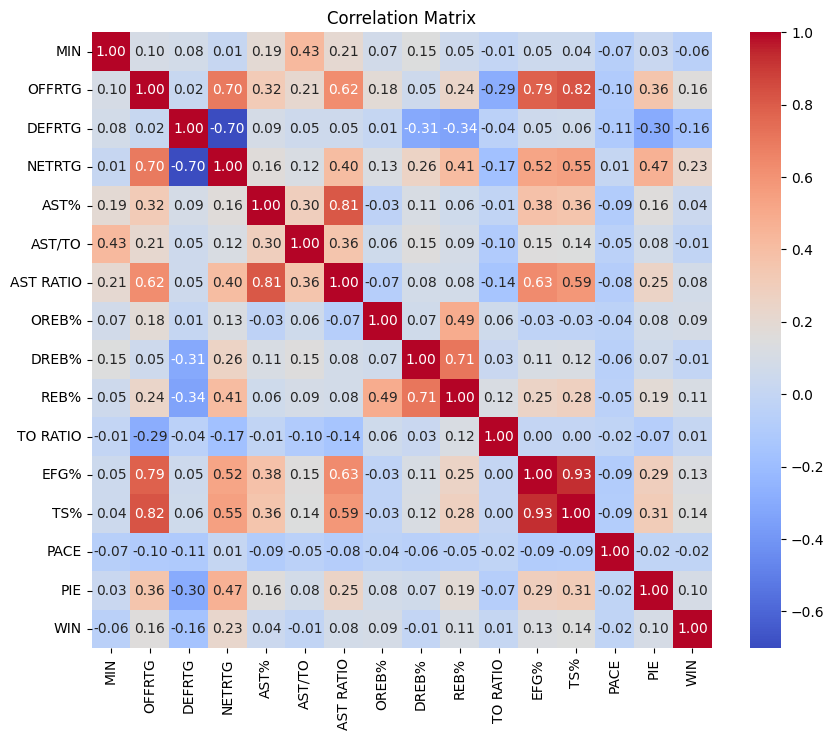

In [ ]:
import seaborn as sns
# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(numericals, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
yes = filtered_data[filtered_data["WIN"] == 1]
no = filtered_data[filtered_data["WIN"] == 0]

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
# Split numerical and categorical variables
numerical_features = ['MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO',
       'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%',
       'PACE', 'PIE']
#categorical_features = ["Sex", "ChestPainType", "FastingBS", "RestingECG", "ExerciseAngina", "ST_Slope", "HeartDisease"]

# Plot the distribution of numerical features
for feature in numerical_features:
    fig = px.histogram(filtered_data, x=feature, title=f"Distribution of {feature}", nbins=50)
    fig.show()

    # Plot the distribution of numerical features By Heart Disease
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=yes[feature], nbinsx=50, opacity=0.5, name='Yes', marker_color='red' ))
    fig.add_trace(go.Histogram(x=no[feature], nbinsx=50, opacity=0.5, name='No', marker_color='blue' ))
    fig.update_layout(title=f"Distribution of {feature} By Win",
                      xaxis_title=feature, yaxis_title="Count", barmode='group')
    fig.show()

In [ ]:
# Import libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

# Define features and target
X = filtered_data.drop(columns=['WIN'])  # Features
y = filtered_data['WIN']  # Target

# Identify categorical and continuous features
categorical_features = ['LINEUPS']
continuous_features = ['MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO',
       'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%',
       'PACE', 'PIE']

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), continuous_features),  # Scaling continuous features
        ('cat', OneHotEncoder(drop='first'), categorical_features)  # One-hot encoding categorical features
    ])

# Apply transformations
X_transformed = preprocessor.fit_transform(X)

In [ ]:
# Convert sparse matrix to dense array
X_transformed_dense = X_transformed.toarray()  # Convert to dense format if sparse

# Combine all column names
continuous_columns = continuous_features
categorical_columns = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
all_columns = list(continuous_columns) + list(categorical_columns)

# Create the DataFrame with the dense array
X_transformed_df = pd.DataFrame(X_transformed_dense, columns=all_columns, index=X.index)

# Display the transformed DataFrame
X_transformed_df.head()


,MIN,OFFRTG,DEFRTG,NETRTG,AST%,AST/TO,AST RATIO,OREB%,DREB%,REB%,TO RATIO,EFG%,TS%,PACE,PIE,LINEUPS_A. Davis - C. Reddish - A. Reaves,LINEUPS_A. Davis - C. Wood - A. Reaves,LINEUPS_A. Davis - C. Wood - T. Prince,LINEUPS_A. Davis - D. Russell - A. Reaves,LINEUPS_A. Davis - D. Russell - C. Reddish,LINEUPS_A. Davis - D. Russell - C. Wood,LINEUPS_A. Davis - D. Russell - M. Christie,LINEUPS_A. Davis - D. Russell - R. Hachimura,LINEUPS_A. Davis - D. Russell - T. Prince,LINEUPS_A. Davis - J. Vanderbilt - A. Reaves,LINEUPS_A. Davis - R. Hachimura - A. Reaves,LINEUPS_A. Davis - R. Hachimura - C. Reddish,LINEUPS_A. Davis - R. Hachimura - M. Christie,LINEUPS_A. Davis - S. Dinwiddie - A. Reaves,LINEUPS_A. Davis - T. Prince - A. Reaves,LINEUPS_A. Davis - T. Prince - C. Reddish,LINEUPS_A. Davis - T. Prince - M. Christie,LINEUPS_A. Davis - T. Prince - R. Hachimura,LINEUPS_C. Wood - A. Reaves - M. Christie,LINEUPS_C. Wood - T. Prince - A. Reaves,LINEUPS_D. Russell - C. Reddish - A. Reaves,LINEUPS_D. Russell - C. Wood - A. Reaves,LINEUPS_D. Russell - C. Wood - T. Prince,LINEUPS_D. Russell - J. Hayes - A. Reaves,LINEUPS_D. Russell - R. Hachimura - A. Reaves,LINEUPS_D. Russell - R. Hachimura - C. Reddish,LINEUPS_D. Russell - R. Hachimura - J. Hayes,LINEUPS_D. Russell - R. Hachimura - M. Christie,LINEUPS_D. Russell - T. Prince - A. Reaves,LINEUPS_D. Russell - T. Prince - C. Reddish,LINEUPS_D. Russell - T. Prince - J. Hayes,LINEUPS_D. Russell - T. Prince - M. Christie,LINEUPS_D. Russell - T. Prince - R. Hachimura,LINEUPS_J. Hayes - A. Reaves - M. Christie,LINEUPS_L. James - A. Davis - A. Reaves,LINEUPS_L. James - A. Davis - C. Reddish,LINEUPS_L. James - A. Davis - D. Russell,LINEUPS_L. James - A. Davis - M. Christie,LINEUPS_L. James - A. Davis - R. Hachimura,LINEUPS_L. James - A. Davis - T. Prince,LINEUPS_L. James - A. Reaves - M. Christie,LINEUPS_L. James - C. Reddish - A. Reaves,LINEUPS_L. James - C. Wood - A. Reaves,LINEUPS_L. James - C. Wood - T. Prince,LINEUPS_L. James - D. Russell - A. Reaves,LINEUPS_L. James - D. Russell - C. Reddish,LINEUPS_L. James - D. Russell - C. Wood,LINEUPS_L. James - D. Russell - J. Hayes,LINEUPS_L. James - D. Russell - M. Christie,LINEUPS_L. James - D. Russell - R. Hachimura,LINEUPS_L. James - D. Russell - T. Prince,LINEUPS_L. James - J. Hayes - A. Reaves,LINEUPS_L. James - R. Hachimura - A. Reaves,LINEUPS_L. James - R. Hachimura - J. Hayes,LINEUPS_L. James - T. Prince - A. Reaves,LINEUPS_L. James - T. Prince - C. Reddish,LINEUPS_L. James - T. Prince - J. Hayes,LINEUPS_L. James - T. Prince - M. Christie,LINEUPS_L. James - T. Prince - R. Hachimura,LINEUPS_R. Hachimura - A. Reaves - M. Christie,LINEUPS_R. Hachimura - C. Reddish - A. Reaves,LINEUPS_R. Hachimura - J. Hayes - A. Reaves,LINEUPS_S. Dinwiddie - R. Hachimura - A. Reaves,LINEUPS_T. Prince - A. Reaves - M. Christie,LINEUPS_T. Prince - C. Reddish - A. Reaves,LINEUPS_T. Prince - J. Hayes - A. Reaves,LINEUPS_T. Prince - J. Hayes - M. Christie,LINEUPS_T. Prince - R. Hachimura - A. Reaves,LINEUPS_T. Prince - R. Hachimura - J. Hayes
0,2.402863,-0.139466,0.488897,-0.448274,0.027610,-0.108194,-0.239703,0.434771,-0.079652,-0.053277,-0.227532,-0.445212,-0.419115,-0.080847,-0.257458,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.495533,0.146164,0.253183,-0.076515,0.074475,0.575094,0.029782,0.287562,-0.075756,0.020823,-0.227532,-0.017601,-0.011829,-0.045909,-0.039355,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.236296,0.207539,0.495969,-0.206042,0.049240,0.325719,-0.002556,0.037306,-0.192633,-0.201478,-0.227532,

In [ ]:
X_transformed_df.columns

Index(['MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO', 'AST RATIO',
       'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%', 'PACE', 'PIE',
       'LINEUPS_A. Davis - C. Reddish - A. Reaves',
       'LINEUPS_A. Davis - C. Wood - A. Reaves',
       'LINEUPS_A. Davis - C. Wood - T. Prince',
       'LINEUPS_A. Davis - D. Russell - A. Reaves',
       'LINEUPS_A. Davis - D. Russell - C. Reddish',
       'LINEUPS_A. Davis - D. Russell - C. Wood',
       'LINEUPS_A. Davis - D. Russell - M. Christie',
       'LINEUPS_A. Davis - D. Russell - R. Hachimura',
       'LINEUPS_A. Davis - D. Russell - T. Prince',
       'LINEUPS_A. Davis - J. Vanderbilt - A. Reaves',
       'LINEUPS_A. Davis - R. Hachimura - A. Reaves',
       'LINEUPS_A. Davis - R. Hachimura - C. Reddish',
       'LINEUPS_A. Davis - R. Hachimura - M. Christie',
       'LINEUPS_A. Davis - S. Dinwiddie - A. Reaves',
       'LINEUPS_A. Davis - T. Prince - A. Reaves',
       'LINEUPS_A. Davis - T. Prince - C. Reddish',
       

In [ ]:
offensive_col = ['DEFRTG', 'DREB%', 'REB%', 'NETRTG','AST%', 'AST/TO', 'AST RATIO', 'TO RATIO'
]

defensive_col = ['OFFRTG', 'OREB%', 'EFG%', 'TS%', 'PACE', 'PIE','AST%', 'AST/TO', 'AST RATIO', 'TO RATIO'
]

playmake_col = ['OFFRTG', 'OREB%', 'EFG%', 'TS%', 'PACE', 'PIE','DEFRTG', 'DREB%', 'REB%', 'NETRTG'
]

off = X_transformed_df.copy(deep=True)
defe = X_transformed_df.copy(deep=True)
play = X_transformed_df.copy(deep=True)

In [ ]:
offensive_X = off.drop(columns=offensive_col)
defensive_X = defe.drop(columns=defensive_col)
playmake_X = play.drop(columns=playmake_col)
offensive_X.head()

,MIN,OFFRTG,OREB%,EFG%,TS%,PACE,PIE,LINEUPS_A. Davis - C. Reddish - A. Reaves,LINEUPS_A. Davis - C. Wood - A. Reaves,LINEUPS_A. Davis - C. Wood - T. Prince,LINEUPS_A. Davis - D. Russell - A. Reaves,LINEUPS_A. Davis - D. Russell - C. Reddish,LINEUPS_A. Davis - D. Russell - C. Wood,LINEUPS_A. Davis - D. Russell - M. Christie,LINEUPS_A. Davis - D. Russell - R. Hachimura,LINEUPS_A. Davis - D. Russell - T. Prince,LINEUPS_A. Davis - J. Vanderbilt - A. Reaves,LINEUPS_A. Davis - R. Hachimura - A. Reaves,LINEUPS_A. Davis - R. Hachimura - C. Reddish,LINEUPS_A. Davis - R. Hachimura - M. Christie,LINEUPS_A. Davis - S. Dinwiddie - A. Reaves,LINEUPS_A. Davis - T. Prince - A. Reaves,LINEUPS_A. Davis - T. Prince - C. Reddish,LINEUPS_A. Davis - T. Prince - M. Christie,LINEUPS_A. Davis - T. Prince - R. Hachimura,LINEUPS_C. Wood - A. Reaves - M. Christie,LINEUPS_C. Wood - T. Prince - A. Reaves,LINEUPS_D. Russell - C. Reddish - A. Reaves,LINEUPS_D. Russell - C. Wood - A. Reaves,LINEUPS_D. Russell - C. Wood - T. Prince,LINEUPS_D. Russell - J. Hayes - A. Reaves,LINEUPS_D. Russell - R. Hachimura - A. Reaves,LINEUPS_D. Russell - R. Hachimura - C. Reddish,LINEUPS_D. Russell - R. Hachimura - J. Hayes,LINEUPS_D. Russell - R. Hachimura - M. Christie,LINEUPS_D. Russell - T. Prince - A. Reaves,LINEUPS_D. Russell - T. Prince - C. Reddish,LINEUPS_D. Russell - T. Prince - J. Hayes,LINEUPS_D. Russell - T. Prince - M. Christie,LINEUPS_D. Russell - T. Prince - R. Hachimura,LINEUPS_J. Hayes - A. Reaves - M. Christie,LINEUPS_L. James - A. Davis - A. Reaves,LINEUPS_L. James - A. Davis - C. Reddish,LINEUPS_L. James - A. Davis - D. Russell,LINEUPS_L. James - A. Davis - M. Christie,LINEUPS_L. James - A. Davis - R. Hachimura,LINEUPS_L. James - A. Davis - T. Prince,LINEUPS_L. James - A. Reaves - M. Christie,LINEUPS_L. James - C. Reddish - A. Reaves,LINEUPS_L. James - C. Wood - A. Reaves,LINEUPS_L. James - C. Wood - T. Prince,LINEUPS_L. James - D. Russell - A. Reaves,LINEUPS_L. James - D. Russell - C. Reddish,LINEUPS_L. James - D. Russell - C. Wood,LINEUPS_L. James - D. Russell - J. Hayes,LINEUPS_L. James - D. Russell - M. Christie,LINEUPS_L. James - D. Russell - R. Hachimura,LINEUPS_L. James - D. Russell - T. Prince,LINEUPS_L. James - J. Hayes - A. Reaves,LINEUPS_L. James - R. Hachimura - A. Reaves,LINEUPS_L. James - R. Hachimura - J. Hayes,LINEUPS_L. James - T. Prince - A. Reaves,LINEUPS_L. James - T. Prince - C. Reddish,LINEUPS_L. James - T. Prince - J. Hayes,LINEUPS_L. James - T. Prince - M. Christie,LINEUPS_L. James - T. Prince - R. Hachimura,LINEUPS_R. Hachimura - A. Reaves - M. Christie,LINEUPS_R. Hachimura - C. Reddish - A. Reaves,LINEUPS_R. Hachimura - J. Hayes - A. Reaves,LINEUPS_S. Dinwiddie - R. Hachimura - A. Reaves,LINEUPS_T. Prince - A. Reaves - M. Christie,LINEUPS_T. Prince - C. Reddish - A. Reaves,LINEUPS_T. Prince - J. Hayes - A. Reaves,LINEUPS_T. Prince - J. Hayes - M. Christie,LINEUPS_T. Prince - R. Hachimura - A. Reaves,LINEUPS_T. Prince - R. Hachimura - J. Hayes
0,2.402863,-0.139466,0.434771,-0.445212,-0.419115,-0.080847,-0.257458,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.495533,0.146164,0.287562,-0.017601,-0.011829,-0.045909,-0.039355,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.236296,0.207539,0.037306,0.108167,0.128459,-0.061706,-0.103794,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [ ]:
y.value_counts()

,count
WIN,
1,1635
0,1131


In [ ]:
filtered_data.columns

Index(['LINEUPS', 'MIN', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO',
       'AST RATIO', 'OREB%', 'DREB%', 'REB%', 'TO RATIO', 'EFG%', 'TS%',
       'PACE', 'PIE', 'WIN'],
      dtype='object')

# All Stats

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_auc_score, precision_score,
    recall_score, f1_score, roc_curve
)
import matplotlib.pyplot as plt

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_transformed_df, y, test_size=0.2, random_state=42, stratify=y)

## Supervised Modeling

### Logistec Regression

In [ ]:
# Initialize and train the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)


In [ ]:
# Add constant for intercept
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Train logistic regression model using statsmodels
logit_model = sm.Logit(y_train, X_train_sm).fit()

# Print model summary
print(logit_model.summary())

# Make predictions on test data
y_pred_sm = logit_model.predict(X_test_sm)
y_pred_class = (y_pred_sm > 0.5).astype(int)  # Convert probabilities to binary outcomes



Optimization terminated successfully.
         Current function value: 0.624668
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                    WIN   No. Observations:                 2212
Model:                          Logit   Df Residuals:                     2127
Method:                           MLE   Df Model:                           84
Date:                Mon, 16 Dec 2024   Pseudo R-squ.:                 0.07645
Time:                        01:38:13   Log-Likelihood:                -1381.8
converged:                       True   LL-Null:                       -1496.1
Covariance Type:            nonrobust   LLR p-value:                 2.422e-15
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                             

###Decision Trees

In [ ]:
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_auc_score,
    log_loss,
)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Define the decision tree classifier and the hyperparameter grid
decision_tree = DecisionTreeClassifier(random_state=42)
param_grid = {
    "max_depth": [3,4,5,6,7,8,9,10, None],
    "min_samples_split": [2,3,4,5, 10],
    "min_samples_leaf": [1, 2, 3, 4],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search = GridSearchCV(
    estimator=decision_tree,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search.fit(X_train, y_train)

# Extract the best model
best_tree = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")


Fitting 5 folds for each of 360 candidates, totalling 1800 fits


KeyboardInterrupt: 

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the Random Forest classifier and hyperparameter grid
rf_classifier = RandomForestClassifier(random_state=42)
param_grid_rf = {
    "n_estimators": [20,30, 40, 50, 100, 200],
    "max_depth": [5, 10, 15, 20, None],
    "min_samples_split": [2, 3, 4, 5, 10],
    "min_samples_leaf": [1, 2, 4, 6],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search_rf_model = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid_rf,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_rf_model.fit(X_train, y_train)

# Extract the best model and parameters
best_rf_model = grid_search_rf_model.best_estimator_
best_rf_params = grid_search_rf_model.best_params_
print(f"Best Parameters: {best_rf_params}")


### XGBoost

In [ ]:
import xgboost as xgb

# Define the XGBoost classifier and hyperparameter grid
xgb_classifier = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")
param_grid_xgb = {
    "n_estimators": [20,30,40],
    "max_depth": [3, 5],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

# Perform GridSearchCV
grid_search_xgb = GridSearchCV(
    estimator=xgb_classifier,
    param_grid=param_grid_xgb,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_xgb.fit(X_train, y_train)

# Extract the best model and parameters
best_xgb = grid_search_xgb.best_estimator_
best_xgb_params = grid_search_xgb.best_params_
print(f"Best Parameters: {best_xgb_params}")

## Model Evaluation

### Logistic Regression

In [ ]:

# Evaluate the model
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred_class, average="binary")
auc_roc = roc_auc_score(y_test, y_pred_sm)
logloss = log_loss(y_test, y_pred_sm)
cm = confusion_matrix(y_test, y_pred_class, normalize="true")

# Print evaluation metrics
print("\nMetrics:")
print(f"Precision: {precision:.2f}")
print(f"Recall (Sensitivity): {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"AUC-ROC: {auc_roc:.2f}")
print(f"Log Loss: {logloss:.2f}")
print(f"Normalized Confusion Matrix: {cm}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
cmd.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Logistic Regression)")
plt.show()

NameError: name 'precision_recall_fscore_support' is not defined

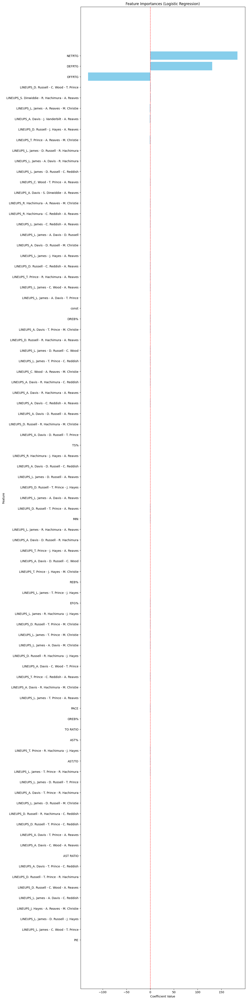

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Get feature coefficients from the model
coefficients = logit_model.params  # Use `model.coef_` if using sklearn logistic regression

# Create a DataFrame for better visualization
feature_importances = pd.DataFrame({
    "Feature": coefficients.index,  # Feature names
    "Importance": coefficients.values  # Coefficients
}).sort_values(by="Importance", ascending=False, key=np.abs)  # Sort by absolute importance

# Plot feature importances
plt.figure(figsize=(10, 60))
plt.barh(feature_importances["Feature"], feature_importances["Importance"], color="skyblue")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.title("Feature Importances (Logistic Regression)")
plt.axvline(0, color="red", linestyle="--", linewidth=1)  # Vertical line at 0 for reference
plt.gca().invert_yaxis()  # Most important feature on top
plt.show()


Confusion Matrix:
[[ 79 148]
 [ 66 261]]

Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.35      0.42       227
           1       0.64      0.80      0.71       327

    accuracy                           0.61       554
   macro avg       0.59      0.57      0.57       554
weighted avg       0.60      0.61      0.59       554

F1 Score: 0.72
ROC AUC Score: 0.63
Precision: 0.65
Recall: 0.81


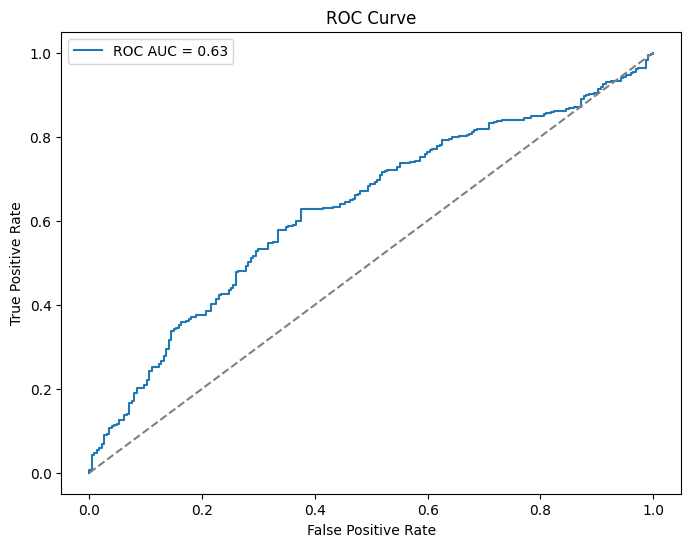

In [ ]:
# Print evaluation metrics
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"F1 Score: {f1:.2f}")
print(f"ROC AUC Score: {roc_auc:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Extract feature names and their corresponding coefficients
coefficients = pd.DataFrame({
    'Feature': X_transformed_df.columns,
    'Coefficient': model.coef_[0],
    'Importance': abs(model.coef_[0])
})

# Sort features by importance
coefficients = coefficients.sort_values(by='Importance', ascending=False)

coefficients

,Feature,Coefficient,Importance
37,LINEUPS_D. Russell - C. Wood - T. Prince,0.740816,0.740816
55,LINEUPS_L. James - A. Reaves - M. Christie,-0.695400,0.695400
77,LINEUPS_S. Dinwiddie - R. Hachimura - A. Reaves,0.687436,0.687436
24,LINEUPS_A. Davis - J. Vanderbilt - A. Reaves,-0.525573,0.525573
78,LINEUPS_T. Prince - A. Reaves - M. Christie,-0.479813,0.479813
64,LINEUPS_L. James - D. Russell - R. Hachimura,0.438100,0.438100
38,LINEUPS_D. Russell - J. Hayes - A. Reaves,0.429180,0.429180
34,LINEUPS_C. Wood - T. Prince - A. Reaves,-0.426472,0.426472
53,LINEUPS_L. James - A. Davis - R. Hachimura,0.394303,0.394303
74,LINEUPS_R. Hachimura - A. Reaves - M. Christie,-0.394165,0.394165


### Decision Trees

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


Decision Tree Metrics:
Precision: 0.77
Recall (Sensitivity): 0.76
F1 Score: 0.77
AUC-ROC: 0.77
Log Loss: 4.93
Normalized Confusion Matrix: [[0.67400881 0.32599119]
 [0.23547401 0.76452599]]


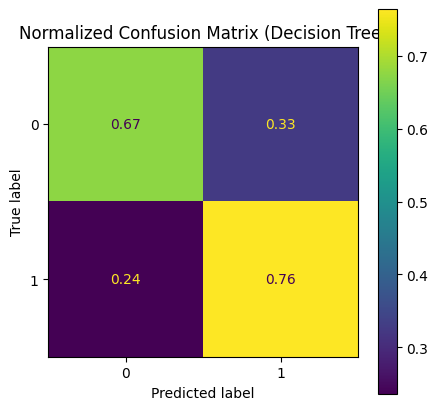

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, log_loss, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define and train the Decision Tree with the specified hyperparameters
best_tree = DecisionTreeClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=4,
    min_samples_split=10,
    random_state=42
)
best_tree.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_tree = best_tree.predict(X_test)
y_proba_tree = best_tree.predict_proba(X_test)[:, 1]

# Compute metrics
precision_tree, recall_tree, f1_tree, _ = precision_recall_fscore_support(
    y_test, y_pred_tree, average="binary"
)
auc_roc_tree = roc_auc_score(y_test, y_proba_tree)
logloss_tree = log_loss(y_test, y_proba_tree)
cm_tree = confusion_matrix(y_test, y_pred_tree, normalize="true")

# Print evaluation metrics
print("\nDecision Tree Metrics:")
print(f"Precision: {precision_tree:.2f}")
print(f"Recall (Sensitivity): {recall_tree:.2f}")
print(f"F1 Score: {f1_tree:.2f}")
print(f"AUC-ROC: {auc_roc_tree:.2f}")
print(f"Log Loss: {logloss_tree:.2f}")
print(f"Normalized Confusion Matrix: {cm_tree}")

# Display the normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_tree = ConfusionMatrixDisplay(confusion_matrix=cm_tree, display_labels=[0, 1])
cmd_tree.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Decision Tree)")
plt.show()



Random Forest Metrics:
Precision: 0.82
Recall (Sensitivity): 0.90
F1 Score: 0.85
AUC-ROC: 0.89
Log Loss: 0.43
Normalized Confusion Matrix:
[[0.7092511  0.2907489 ]
 [0.10397554 0.89602446]]


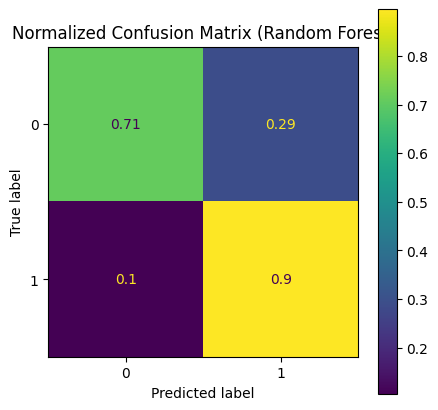


Top Features:
      Feature  Importance
14        PIE    0.088626
3      NETRTG    0.081122
13       PACE    0.073719
2      DEFRTG    0.072313
12        TS%    0.071919
1      OFFRTG    0.062841
11       EFG%    0.059514
9        REB%    0.058138
6   AST RATIO    0.052873
0         MIN    0.052771


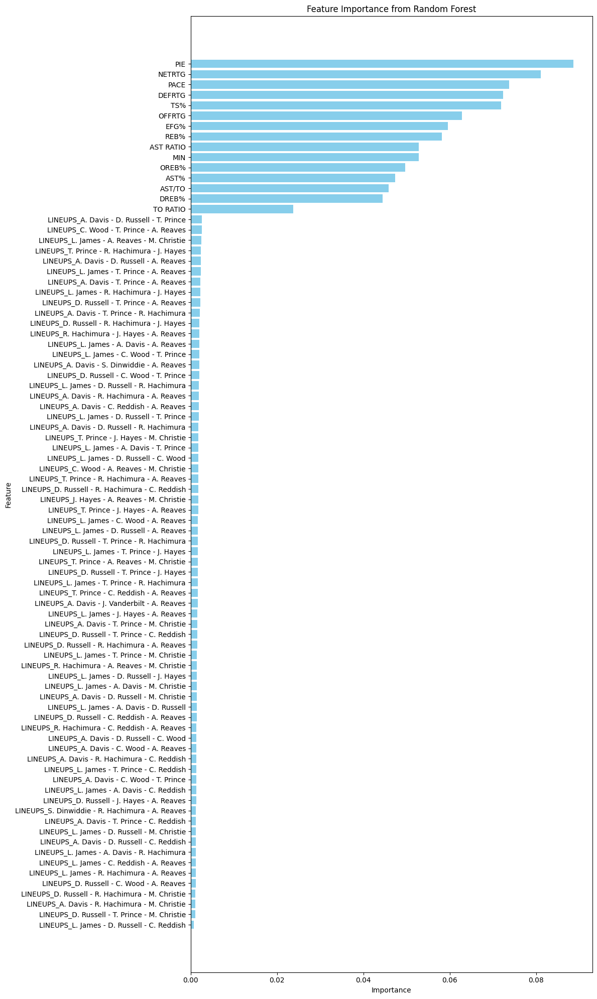

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    precision_recall_fscore_support,
    roc_auc_score,
    log_loss,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
import matplotlib.pyplot as plt
import pandas as pd

# Define and train the Random Forest model with specified parameters
best_rf_model = RandomForestClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    class_weight='balanced',
    random_state=42
)
best_rf_model.fit(X_train, y_train)

# Evaluate the best Random Forest model on the test set
y_pred_rf_model = best_rf_model.predict(X_test)
y_proba_rf_model = best_rf_model.predict_proba(X_test)[:, 1]

# Compute metrics
precision_rf_model, recall_rf_model, f1_rf_model, _ = precision_recall_fscore_support(
    y_test, y_pred_rf_model, average="binary"
)
auc_roc_rf_model = roc_auc_score(y_test, y_proba_rf_model)
logloss_rf_model = log_loss(y_test, y_proba_rf_model)
cm_rf_model = confusion_matrix(y_test, y_pred_rf_model, normalize="true")

# Print evaluation metrics
print("\nRandom Forest Metrics:")
print(f"Precision: {precision_rf_model:.2f}")
print(f"Recall (Sensitivity): {recall_rf_model:.2f}")
print(f"F1 Score: {f1_rf_model:.2f}")
print(f"AUC-ROC: {auc_roc_rf_model:.2f}")
print(f"Log Loss: {logloss_rf_model:.2f}")
print(f"Normalized Confusion Matrix:\n{cm_rf_model}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_rf_model = ConfusionMatrixDisplay(confusion_matrix=cm_rf_model, display_labels=[0, 1])
cmd_rf_model.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Random Forest)")
plt.show()

# Feature Importance
feature_importance = best_rf_model.feature_importances_
features = X_train.columns  # Assuming X_train is a DataFrame

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": feature_importance
}).sort_values(by="Importance", ascending=False)

# Print the top features
print("\nTop Features:")
print(importance_df.head(10))

# Plot feature importance
plt.figure(figsize=(12, 20))
plt.barh(importance_df["Feature"], importance_df["Importance"], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance from Random Forest")
plt.gca().invert_yaxis()  # Show most important features at the top
plt.tight_layout()
plt.show()


### Random Forest

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


Random Forest Metrics:
Precision: 0.67
Recall (Sensitivity): 0.75
F1 Score: 0.71
AUC-ROC: 0.65
Log Loss: 0.67
Normalized Confusion Matrix: [[0.47136564 0.52863436]
 [0.25076453 0.74923547]]


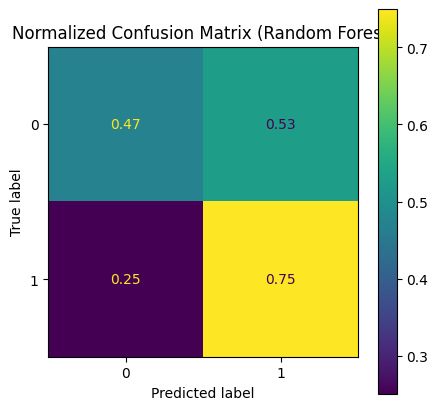


Top Features:
                                          Feature  Importance
3                                       AST RATIO    0.167980
0                                             MIN    0.142706
1                                            AST%    0.130079
2                                          AST/TO    0.106271
4                                        TO RATIO    0.046944
19       LINEUPS_A. Davis - T. Prince - A. Reaves    0.009750
59       LINEUPS_L. James - T. Prince - A. Reaves    0.008632
72   LINEUPS_T. Prince - R. Hachimura - A. Reaves    0.008544
55      LINEUPS_L. James - D. Russell - T. Prince    0.008292
37  LINEUPS_D. Russell - T. Prince - R. Hachimura    0.007738


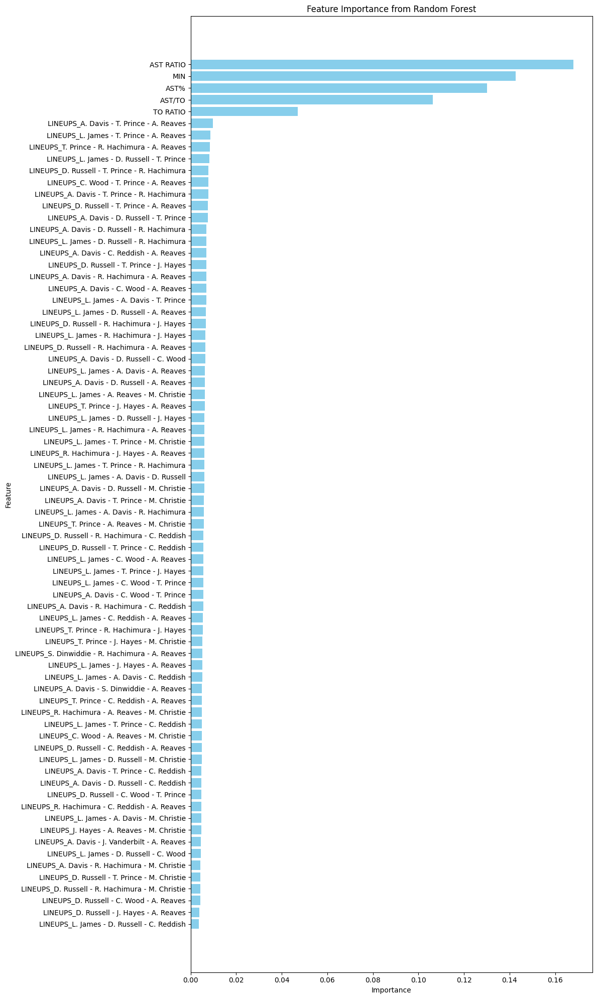

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Define and train the Random Forest model with specified parameters
best_rf_model = RandomForestClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    class_weight='balanced',
    random_state=42
)
best_rf_model.fit(X_train, y_train)

# Evaluate the best Random Forest model on the test set
y_pred_rf_model = best_rf_model.predict(X_test)
y_proba_rf_model = best_rf_model.predict_proba(X_test)[:, 1]

# Compute metrics
precision_rf_model, recall_rf_model, f1_rf_model, _ = precision_recall_fscore_support(
    y_test, y_pred_rf_model, average="binary"
)
auc_roc_rf_model = roc_auc_score(y_test, y_proba_rf_model)
logloss_rf_model = log_loss(y_test, y_proba_rf_model)
cm_rf_model = confusion_matrix(y_test, y_pred_rf_model, normalize="true")

# Print evaluation metrics
print("\nRandom Forest Metrics:")
print(f"Precision: {precision_rf_model:.2f}")
print(f"Recall (Sensitivity): {recall_rf_model:.2f}")
print(f"F1 Score: {f1_rf_model:.2f}")
print(f"AUC-ROC: {auc_roc_rf_model:.2f}")
print(f"Log Loss: {logloss_rf_model:.2f}")
print(f"Normalized Confusion Matrix: {cm_rf_model}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_rf_model = ConfusionMatrixDisplay(confusion_matrix=cm_rf_model, display_labels=[0, 1])
cmd_rf_model.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Random Forest)")
plt.show()

 # Feature Importance
feature_importance = best_rf_model.feature_importances_
features = X_train.columns  # Assuming X_train is a DataFrame

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": feature_importance
}).sort_values(by="Importance", ascending=False)

# Print the top features
print("\nTop Features:")
print(importance_df.head(10))

# Plot feature importance
plt.figure(figsize=(12, 20))
plt.barh(importance_df["Feature"], importance_df["Importance"], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance from Random Forest")
plt.gca().invert_yaxis()  # Show most important features at the top
plt.tight_layout()
plt.show()


### XGBoost

Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 40, 'subsample': 0.8}


XGBoost Metrics:
Precision: 0.75
Recall (Sensitivity): 0.85
F1 Score: 0.80
AUC-ROC: 0.80
Log Loss: 0.53
Normalized Confusion Matrix: [[0.58590308 0.41409692]
 [0.14678899 0.85321101]]


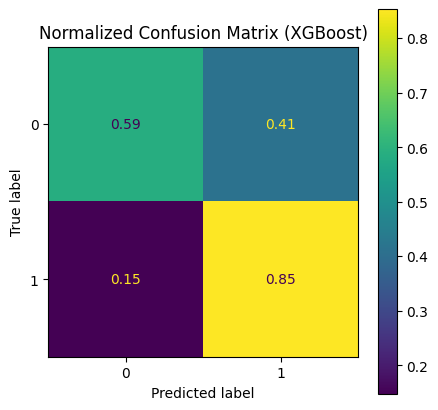

In [ ]:
from xgboost import XGBClassifier

# Define and train the XGBoost model with specified parameters
best_xgb = XGBClassifier(
    colsample_bytree=1.0,
    learning_rate=0.1,
    max_depth=5,
    min_child_weight=5,
    n_estimators=40,
    subsample=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)
best_xgb.fit(X_train, y_train)

# Evaluate the best XGBoost model on the test set
y_pred_xgb = best_xgb.predict(X_test)
y_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

# Compute metrics
precision_xgb, recall_xgb, f1_xgb, _ = precision_recall_fscore_support(
    y_test, y_pred_xgb, average="binary"
)
auc_roc_xgb = roc_auc_score(y_test, y_proba_xgb)
logloss_xgb = log_loss(y_test, y_proba_xgb)
cm_xgb = confusion_matrix(y_test, y_pred_xgb, normalize="true")

# Print evaluation metrics
print("\nXGBoost Metrics:")
print(f"Precision: {precision_xgb:.2f}")
print(f"Recall (Sensitivity): {recall_xgb:.2f}")
print(f"F1 Score: {f1_xgb:.2f}")
print(f"AUC-ROC: {auc_roc_xgb:.2f}")
print(f"Log Loss: {logloss_xgb:.2f}")
print(f"Normalized Confusion Matrix: {cm_xgb}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb, display_labels=[0, 1])
cmd_xgb.plot(ax=ax)
plt.title("Normalized Confusion Matrix (XGBoost)")
plt.show()


# Offensive Stats Only

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_auc_score, precision_score,
    recall_score, f1_score, roc_curve
)
import matplotlib.pyplot as plt

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(offensive_X, y, test_size=0.2, random_state=42, stratify=y)

## Supervised Modeling

### Logistec Regression

In [ ]:
# Initialize and train the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)


In [ ]:
# Add constant for intercept
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Train logistic regression model using statsmodels
logit_model = sm.Logit(y_train, X_train_sm).fit()

# Print model summary
print(logit_model.summary())

# Make predictions on test data
y_pred_sm = logit_model.predict(X_test_sm)
y_pred_class = (y_pred_sm > 0.5).astype(int)  # Convert probabilities to binary outcomes



Optimization terminated successfully.
         Current function value: 0.645298
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    WIN   No. Observations:                 2212
Model:                          Logit   Df Residuals:                     2135
Method:                           MLE   Df Model:                           76
Date:                Sun, 15 Dec 2024   Pseudo R-squ.:                 0.04595
Time:                        18:23:10   Log-Likelihood:                -1427.4
converged:                       True   LL-Null:                       -1496.1
Covariance Type:            nonrobust   LLR p-value:                 2.023e-05
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                             

###Decision Trees

In [ ]:
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_auc_score,
    log_loss,
)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Define the decision tree classifier and the hyperparameter grid
decision_tree = DecisionTreeClassifier(random_state=42)
param_grid = {
    "max_depth": [3,4,5,6,7,8,9,10, None],
    "min_samples_split": [2,3,4,5, 10],
    "min_samples_leaf": [1, 2, 3, 4],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search = GridSearchCV(
    estimator=decision_tree,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search.fit(X_train, y_train)

# Extract the best model
best_tree = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")


Fitting 5 folds for each of 360 candidates, totalling 1800 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 2}


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the Random Forest classifier and hyperparameter grid
rf_classifier = RandomForestClassifier(random_state=42)
param_grid_rf = {
    "n_estimators": [20,30, 40],
    "max_depth": [5, 10, 15, None],
    "min_samples_split": [2, 3, 4],
    "min_samples_leaf": [1, 2, 4],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search_rf_model = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid_rf,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_rf_model.fit(X_train, y_train)

# Extract the best model and parameters
best_rf_model = grid_search_rf_model.best_estimator_
best_rf_params = grid_search_rf_model.best_params_
print(f"Best Parameters: {best_rf_params}")


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 40}


### XGBoost

In [ ]:
import xgboost as xgb

# Define the XGBoost classifier and hyperparameter grid
xgb_classifier = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")
param_grid_xgb = {
    "n_estimators": [20,30,40,100],
    "max_depth": [3, 5],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

# Perform GridSearchCV
grid_search_xgb = GridSearchCV(
    estimator=xgb_classifier,
    param_grid=param_grid_xgb,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_xgb.fit(X_train, y_train)

# Extract the best model and parameters
best_xgb = grid_search_xgb.best_estimator_
best_xgb_params = grid_search_xgb.best_params_
print(f"Best Parameters: {best_xgb_params}")

Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}


## Model Evaluation

### Logistic Regression


Metrics:
Precision: 0.61
Recall (Sensitivity): 0.81
F1 Score: 0.69
AUC-ROC: 0.56
Log Loss: 0.69
Normalized Confusion Matrix: [[0.24229075 0.75770925]
 [0.19266055 0.80733945]]


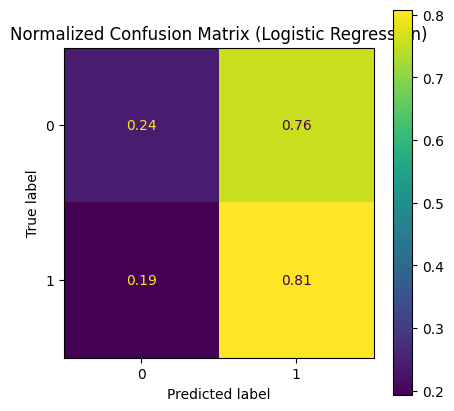

In [ ]:

# Evaluate the model
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred_class, average="binary")
auc_roc = roc_auc_score(y_test, y_pred_sm)
logloss = log_loss(y_test, y_pred_sm)
cm = confusion_matrix(y_test, y_pred_class, normalize="true")

# Print evaluation metrics
print("\nMetrics:")
print(f"Precision: {precision:.2f}")
print(f"Recall (Sensitivity): {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"AUC-ROC: {auc_roc:.2f}")
print(f"Log Loss: {logloss:.2f}")
print(f"Normalized Confusion Matrix: {cm}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
cmd.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Logistic Regression)")
plt.show()

Confusion Matrix:
[[ 53 174]
 [ 59 268]]

Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.23      0.31       227
           1       0.61      0.82      0.70       327

    accuracy                           0.58       554
   macro avg       0.54      0.53      0.50       554
weighted avg       0.55      0.58      0.54       554

F1 Score: 0.69
ROC AUC Score: 0.57
Precision: 0.61
Recall: 0.81


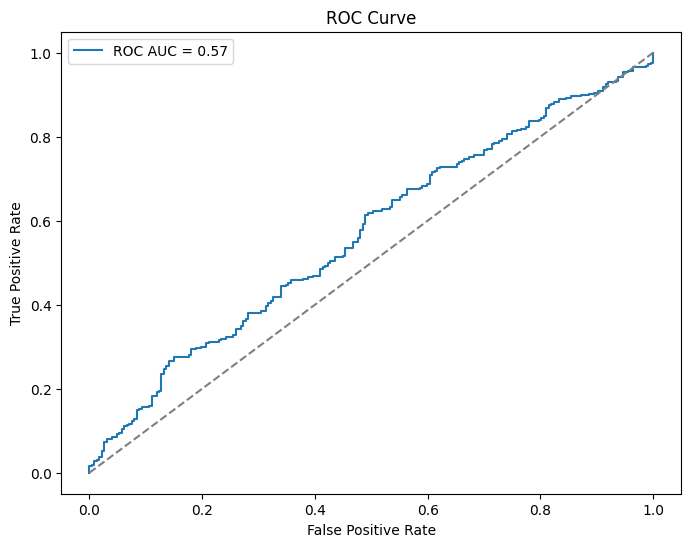

In [ ]:
# Print evaluation metrics
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"F1 Score: {f1:.2f}")
print(f"ROC AUC Score: {roc_auc:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Extract feature names and their corresponding coefficients
coefficients = pd.DataFrame({
    'Feature': offensive_X.columns,
    'Coefficient': model.coef_[0],
    'Importance': abs(model.coef_[0])
})

# Sort features by importance
coefficients = coefficients.sort_values(by='Importance', ascending=False)

coefficients

,Feature,Coefficient,Importance
29,LINEUPS_D. Russell - C. Wood - T. Prince,0.681998,0.681998
69,LINEUPS_S. Dinwiddie - R. Hachimura - A. Reaves,0.554455,0.554455
47,LINEUPS_L. James - A. Reaves - M. Christie,-0.522371,0.522371
16,LINEUPS_A. Davis - J. Vanderbilt - A. Reaves,-0.490060,0.490060
27,LINEUPS_D. Russell - C. Reddish - A. Reaves,-0.474188,0.474188
70,LINEUPS_T. Prince - A. Reaves - M. Christie,-0.468893,0.468893
26,LINEUPS_C. Wood - T. Prince - A. Reaves,-0.465081,0.465081
56,LINEUPS_L. James - D. Russell - R. Hachimura,0.457378,0.457378
48,LINEUPS_L. James - C. Reddish - A. Reaves,-0.427566,0.427566
52,LINEUPS_L. James - D. Russell - C. Reddish,0.423210,0.423210


### Decision Trees

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 2}


Decision Tree Metrics:
Precision: 0.75
Recall (Sensitivity): 0.74
F1 Score: 0.75
AUC-ROC: 0.73
Log Loss: 7.31
Normalized Confusion Matrix: [[0.65198238 0.34801762]
 [0.25688073 0.74311927]]


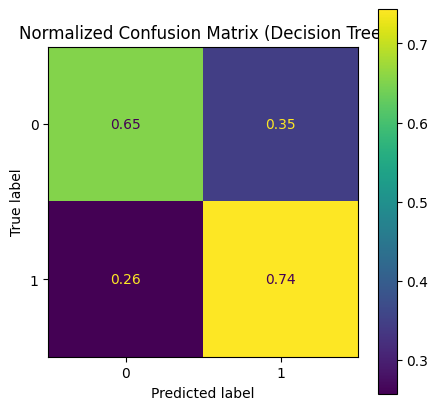

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, log_loss, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define and train the Decision Tree with the specified hyperparameters
best_tree = DecisionTreeClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=3,
    min_samples_split=2,
    random_state=42
)
best_tree.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_tree = best_tree.predict(X_test)
y_proba_tree = best_tree.predict_proba(X_test)[:, 1]

# Compute metrics
precision_tree, recall_tree, f1_tree, _ = precision_recall_fscore_support(
    y_test, y_pred_tree, average="binary"
)
auc_roc_tree = roc_auc_score(y_test, y_proba_tree)
logloss_tree = log_loss(y_test, y_proba_tree)
cm_tree = confusion_matrix(y_test, y_pred_tree, normalize="true")

# Print evaluation metrics
print("\nDecision Tree Metrics:")
print(f"Precision: {precision_tree:.2f}")
print(f"Recall (Sensitivity): {recall_tree:.2f}")
print(f"F1 Score: {f1_tree:.2f}")
print(f"AUC-ROC: {auc_roc_tree:.2f}")
print(f"Log Loss: {logloss_tree:.2f}")
print(f"Normalized Confusion Matrix: {cm_tree}")

# Display the normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_tree = ConfusionMatrixDisplay(confusion_matrix=cm_tree, display_labels=[0, 1])
cmd_tree.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Decision Tree)")
plt.show()


### Random Forest

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 40}


Random Forest Metrics:
Precision: 0.76
Recall (Sensitivity): 0.82
F1 Score: 0.79
AUC-ROC: 0.82
Log Loss: 0.51
Normalized Confusion Matrix: [[0.62995595 0.37004405]
 [0.17737003 0.82262997]]


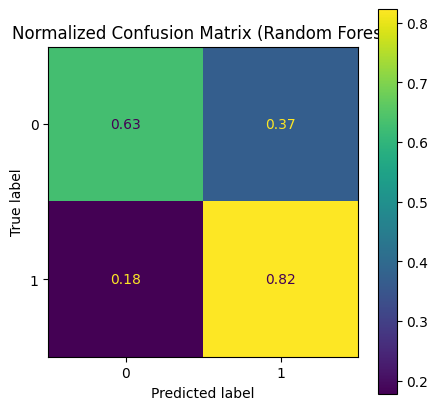


Top Features:
                                         Feature  Importance
6                                            PIE    0.152369
5                                           PACE    0.118951
4                                            TS%    0.117055
1                                         OFFRTG    0.109291
3                                           EFG%    0.097073
0                                            MIN    0.087078
2                                          OREB%    0.080826
61      LINEUPS_L. James - T. Prince - A. Reaves    0.005233
14  LINEUPS_A. Davis - D. Russell - R. Hachimura    0.004949
60    LINEUPS_L. James - R. Hachimura - J. Hayes    0.004825


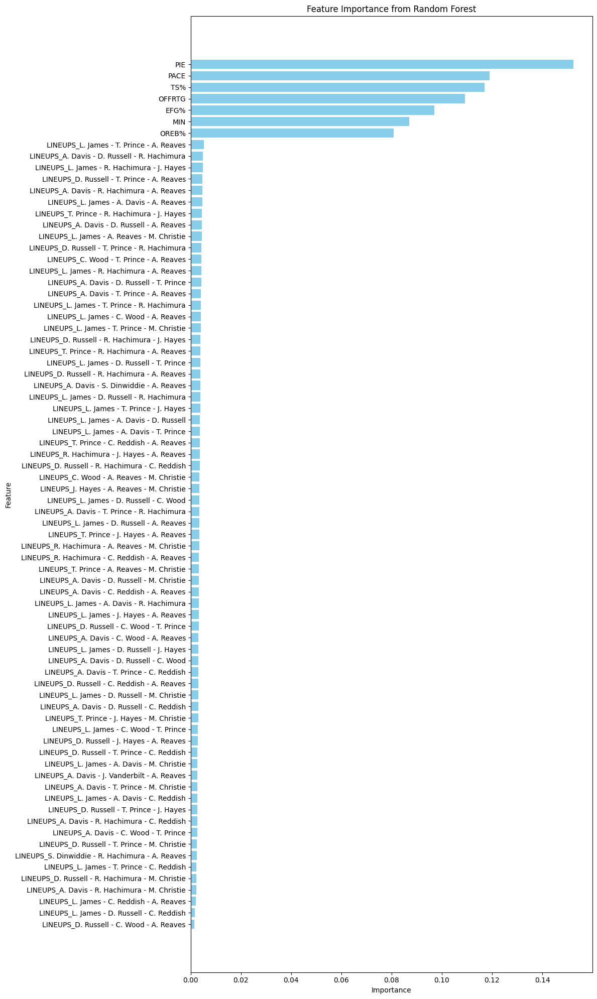

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Define and train the Random Forest model with specified parameters
best_rf_model = RandomForestClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=40,
    random_state=42
)
best_rf_model.fit(X_train, y_train)

# Evaluate the best Random Forest model on the test set
y_pred_rf_model = best_rf_model.predict(X_test)
y_proba_rf_model = best_rf_model.predict_proba(X_test)[:, 1]

# Compute metrics
precision_rf_model, recall_rf_model, f1_rf_model, _ = precision_recall_fscore_support(
    y_test, y_pred_rf_model, average="binary"
)
auc_roc_rf_model = roc_auc_score(y_test, y_proba_rf_model)
logloss_rf_model = log_loss(y_test, y_proba_rf_model)
cm_rf_model = confusion_matrix(y_test, y_pred_rf_model, normalize="true")

# Print evaluation metrics
print("\nRandom Forest Metrics:")
print(f"Precision: {precision_rf_model:.2f}")
print(f"Recall (Sensitivity): {recall_rf_model:.2f}")
print(f"F1 Score: {f1_rf_model:.2f}")
print(f"AUC-ROC: {auc_roc_rf_model:.2f}")
print(f"Log Loss: {logloss_rf_model:.2f}")
print(f"Normalized Confusion Matrix: {cm_rf_model}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_rf_model = ConfusionMatrixDisplay(confusion_matrix=cm_rf_model, display_labels=[0, 1])
cmd_rf_model.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Random Forest)")
plt.show()

# Feature Importance
feature_importance = best_rf_model.feature_importances_
features = X_train.columns  # Assuming X_train is a DataFrame

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": feature_importance
}).sort_values(by="Importance", ascending=False)

# Print the top features
print("\nTop Features:")
print(importance_df.head(10))

# Plot feature importance
plt.figure(figsize=(12, 20))
plt.barh(importance_df["Feature"], importance_df["Importance"], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance from Random Forest")
plt.gca().invert_yaxis()  # Show most important features at the top
plt.tight_layout()
plt.show()

### XGBoost

Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}


XGBoost Metrics:
Precision: 0.75
Recall (Sensitivity): 0.82
F1 Score: 0.78
AUC-ROC: 0.79
Log Loss: 0.55
Normalized Confusion Matrix: [[0.59911894 0.40088106]
 [0.18042813 0.81957187]]


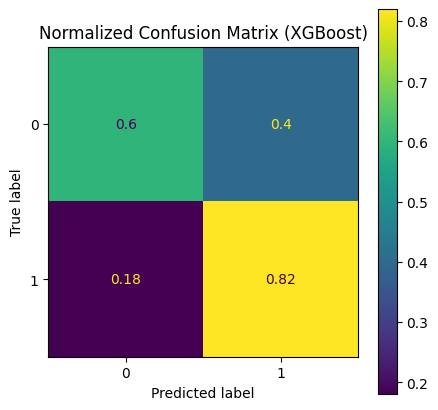

In [ ]:
from xgboost import XGBClassifier

# Define and train the XGBoost model with specified parameters
best_xgb = XGBClassifier(
    colsample_bytree=1,
    learning_rate=0.1,
    max_depth=5,
    n_estimators=100,
    subsample=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)
best_xgb.fit(X_train, y_train)

# Evaluate the best XGBoost model on the test set
y_pred_xgb = best_xgb.predict(X_test)
y_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

# Compute metrics
precision_xgb, recall_xgb, f1_xgb, _ = precision_recall_fscore_support(
    y_test, y_pred_xgb, average="binary"
)
auc_roc_xgb = roc_auc_score(y_test, y_proba_xgb)
logloss_xgb = log_loss(y_test, y_proba_xgb)
cm_xgb = confusion_matrix(y_test, y_pred_xgb, normalize="true")

# Print evaluation metrics
print("\nXGBoost Metrics:")
print(f"Precision: {precision_xgb:.2f}")
print(f"Recall (Sensitivity): {recall_xgb:.2f}")
print(f"F1 Score: {f1_xgb:.2f}")
print(f"AUC-ROC: {auc_roc_xgb:.2f}")
print(f"Log Loss: {logloss_xgb:.2f}")
print(f"Normalized Confusion Matrix: {cm_xgb}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb, display_labels=[0, 1])
cmd_xgb.plot(ax=ax)
plt.title("Normalized Confusion Matrix (XGBoost)")
plt.show()


# Defensive Stats

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_auc_score, precision_score,
    recall_score, f1_score, roc_curve
)
import matplotlib.pyplot as plt

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(defensive_X, y, test_size=0.2, random_state=42, stratify=y)

## Supervised Modeling

### Logistec Regression

In [ ]:
# Initialize and train the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)


In [ ]:
# Add constant for intercept
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Train logistic regression model using statsmodels
logit_model = sm.Logit(y_train, X_train_sm).fit()

# Print model summary
print(logit_model.summary())

# Make predictions on test data
y_pred_sm = logit_model.predict(X_test_sm)
y_pred_class = (y_pred_sm > 0.5).astype(int)  # Convert probabilities to binary outcomes



Optimization terminated successfully.
         Current function value: 0.629661
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    WIN   No. Observations:                 2212
Model:                          Logit   Df Residuals:                     2137
Method:                           MLE   Df Model:                           74
Date:                Sun, 15 Dec 2024   Pseudo R-squ.:                 0.06906
Time:                        23:06:21   Log-Likelihood:                -1392.8
converged:                       True   LL-Null:                       -1496.1
Covariance Type:            nonrobust   LLR p-value:                 1.774e-14
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                             

### Decision Trees

In [ ]:
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_auc_score,
    log_loss,
)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Define the decision tree classifier and the hyperparameter grid
decision_tree = DecisionTreeClassifier(random_state=42)
param_grid = {
    "max_depth": [3,4,5,6,7,8,9,10, None],
    "min_samples_split": [2,3,4,5, 10],
    "min_samples_leaf": [1, 2, 3, 4],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search = GridSearchCV(
    estimator=decision_tree,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search.fit(X_train, y_train)

# Extract the best model
best_tree = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")


Fitting 5 folds for each of 360 candidates, totalling 1800 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the Random Forest classifier and hyperparameter grid
rf_classifier = RandomForestClassifier(random_state=42)
param_grid_rf = {
    "n_estimators": [20,30, 40],
    "max_depth": [5, 10, 15, None],
    "min_samples_split": [2, 3, 4],
    "min_samples_leaf": [1, 2, 4],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search_rf_model = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid_rf,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_rf_model.fit(X_train, y_train)

# Extract the best model and parameters
best_rf_model = grid_search_rf_model.best_estimator_
best_rf_params = grid_search_rf_model.best_params_
print(f"Best Parameters: {best_rf_params}")


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 40}


### XGBoost

In [ ]:
import xgboost as xgb

# Define the XGBoost classifier and hyperparameter grid
xgb_classifier = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")
param_grid_xgb = {
    "n_estimators": [20,30,40,100],
    "max_depth": [3, 5],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

# Perform GridSearchCV
grid_search_xgb = GridSearchCV(
    estimator=xgb_classifier,
    param_grid=param_grid_xgb,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_xgb.fit(X_train, y_train)

# Extract the best model and parameters
best_xgb = grid_search_xgb.best_estimator_
best_xgb_params = grid_search_xgb.best_params_
print(f"Best Parameters: {best_xgb_params}")

Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}


## Model Evaluation

### Logistic Regression


Metrics:
Precision: 0.64
Recall (Sensitivity): 0.79
F1 Score: 0.71
AUC-ROC: 0.62
Log Loss: 0.67
Normalized Confusion Matrix: [[0.35682819 0.64317181]
 [0.21100917 0.78899083]]


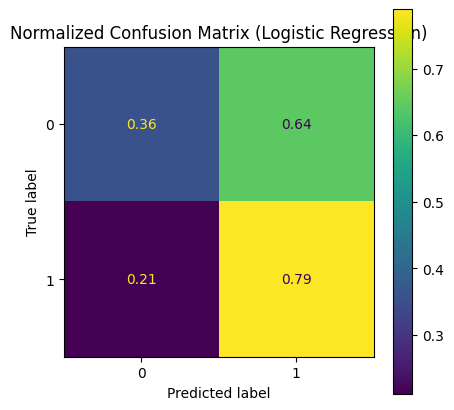

In [ ]:

# Evaluate the model
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred_class, average="binary")
auc_roc = roc_auc_score(y_test, y_pred_sm)
logloss = log_loss(y_test, y_pred_sm)
cm = confusion_matrix(y_test, y_pred_class, normalize="true")

# Print evaluation metrics
print("\nMetrics:")
print(f"Precision: {precision:.2f}")
print(f"Recall (Sensitivity): {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"AUC-ROC: {auc_roc:.2f}")
print(f"Log Loss: {logloss:.2f}")
print(f"Normalized Confusion Matrix: {cm}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
cmd.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Logistic Regression)")
plt.show()

Confusion Matrix:
[[ 80 147]
 [ 63 264]]

Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.35      0.43       227
           1       0.64      0.81      0.72       327

    accuracy                           0.62       554
   macro avg       0.60      0.58      0.57       554
weighted avg       0.61      0.62      0.60       554

F1 Score: 0.71
ROC AUC Score: 0.63
Precision: 0.64
Recall: 0.79


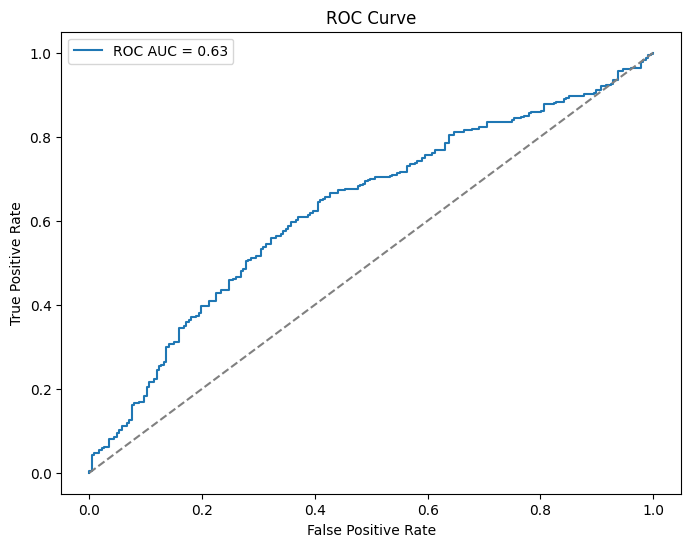

In [ ]:
# Print evaluation metrics
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"F1 Score: {f1:.2f}")
print(f"ROC AUC Score: {roc_auc:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Extract feature names and their corresponding coefficients
coefficients = pd.DataFrame({
    'Feature': defensive_X.columns,
    'Coefficient': model.coef_[0],
    'Importance': abs(model.coef_[0])
})

# Sort features by importance
coefficients = coefficients.sort_values(by='Importance', ascending=False)

coefficients

,Feature,Coefficient,Importance
27,LINEUPS_D. Russell - C. Wood - T. Prince,0.696588,0.696588
45,LINEUPS_L. James - A. Reaves - M. Christie,-0.661509,0.661509
67,LINEUPS_S. Dinwiddie - R. Hachimura - A. Reaves,0.644530,0.644530
68,LINEUPS_T. Prince - A. Reaves - M. Christie,-0.534091,0.534091
2,NETRTG,0.508004,0.508004
14,LINEUPS_A. Davis - J. Vanderbilt - A. Reaves,-0.454120,0.454120
54,LINEUPS_L. James - D. Russell - R. Hachimura,0.448652,0.448652
24,LINEUPS_C. Wood - T. Prince - A. Reaves,-0.414227,0.414227
50,LINEUPS_L. James - D. Russell - C. Reddish,0.395798,0.395798
3,DREB%,-0.378368,0.378368


### Decision Trees

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


Decision Tree Metrics:
Precision: 0.74
Recall (Sensitivity): 0.75
F1 Score: 0.74
AUC-ROC: 0.72
Log Loss: 6.29
Normalized Confusion Matrix: [[0.62114537 0.37885463]
 [0.25382263 0.74617737]]


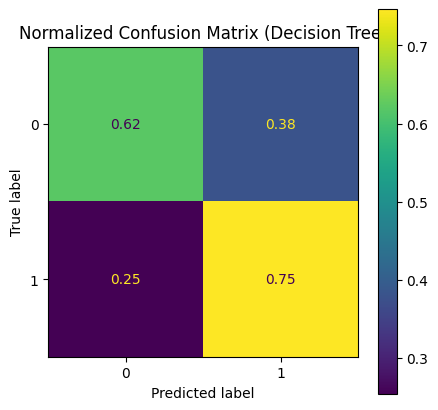

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, log_loss, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define and train the Decision Tree with the specified hyperparameters
best_tree = DecisionTreeClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=4,
    min_samples_split=10,
    random_state=42
)
best_tree.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_tree = best_tree.predict(X_test)
y_proba_tree = best_tree.predict_proba(X_test)[:, 1]

# Compute metrics
precision_tree, recall_tree, f1_tree, _ = precision_recall_fscore_support(
    y_test, y_pred_tree, average="binary"
)
auc_roc_tree = roc_auc_score(y_test, y_proba_tree)
logloss_tree = log_loss(y_test, y_proba_tree)
cm_tree = confusion_matrix(y_test, y_pred_tree, normalize="true")

# Print evaluation metrics
print("\nDecision Tree Metrics:")
print(f"Precision: {precision_tree:.2f}")
print(f"Recall (Sensitivity): {recall_tree:.2f}")
print(f"F1 Score: {f1_tree:.2f}")
print(f"AUC-ROC: {auc_roc_tree:.2f}")
print(f"Log Loss: {logloss_tree:.2f}")
print(f"Normalized Confusion Matrix: {cm_tree}")

# Display the normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_tree = ConfusionMatrixDisplay(confusion_matrix=cm_tree, display_labels=[0, 1])
cmd_tree.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Decision Tree)")
plt.show()


### Random Forest

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 40}


Random Forest Metrics:
Precision: 0.76
Recall (Sensitivity): 0.82
F1 Score: 0.79
AUC-ROC: 0.79
Log Loss: 0.54
Normalized Confusion Matrix: [[0.62555066 0.37444934]
 [0.17737003 0.82262997]]


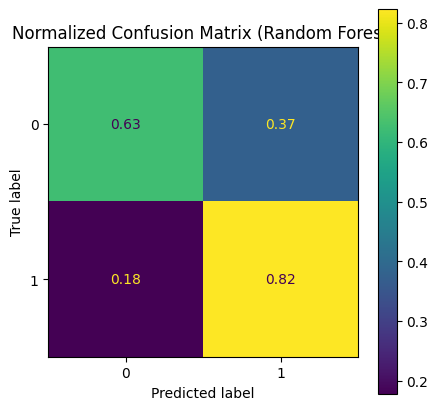


Top Features:
                                         Feature  Importance
2                                         NETRTG    0.187621
1                                         DEFRTG    0.153513
4                                           REB%    0.127761
0                                            MIN    0.109357
3                                          DREB%    0.098140
19      LINEUPS_A. Davis - T. Prince - A. Reaves    0.006902
13     LINEUPS_A. Davis - D. Russell - T. Prince    0.006879
73   LINEUPS_T. Prince - R. Hachimura - J. Hayes    0.006326
12  LINEUPS_A. Davis - D. Russell - R. Hachimura    0.006294
72  LINEUPS_T. Prince - R. Hachimura - A. Reaves    0.006163


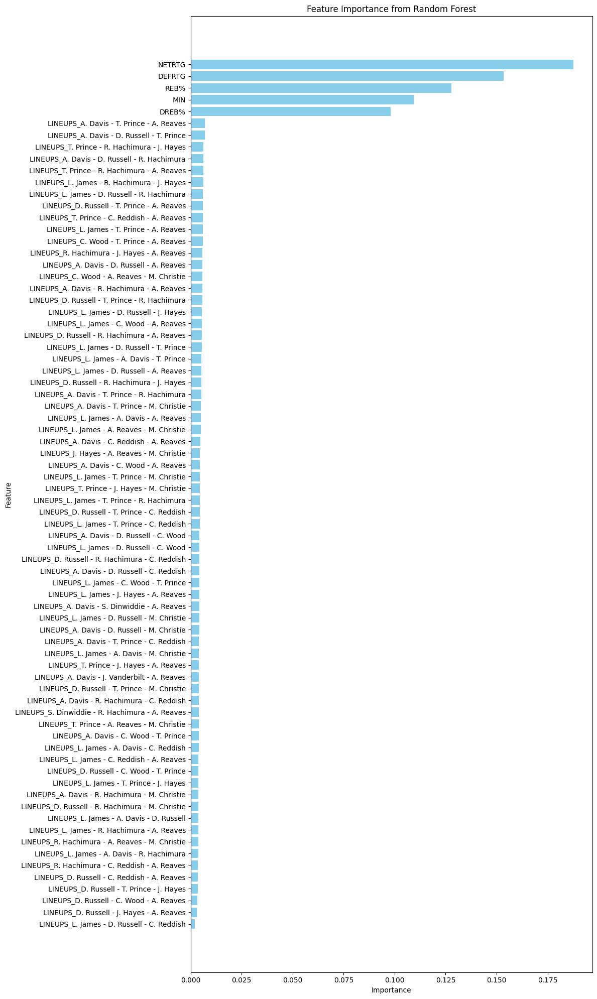

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Define and train the Random Forest model with specified parameters
best_rf_model = RandomForestClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=3,
    n_estimators=40,
    random_state=42
)
best_rf_model.fit(X_train, y_train)

# Evaluate the best Random Forest model on the test set
y_pred_rf_model = best_rf_model.predict(X_test)
y_proba_rf_model = best_rf_model.predict_proba(X_test)[:, 1]

# Compute metrics
precision_rf_model, recall_rf_model, f1_rf_model, _ = precision_recall_fscore_support(
    y_test, y_pred_rf_model, average="binary"
)
auc_roc_rf_model = roc_auc_score(y_test, y_proba_rf_model)
logloss_rf_model = log_loss(y_test, y_proba_rf_model)
cm_rf_model = confusion_matrix(y_test, y_pred_rf_model, normalize="true")

# Print evaluation metrics
print("\nRandom Forest Metrics:")
print(f"Precision: {precision_rf_model:.2f}")
print(f"Recall (Sensitivity): {recall_rf_model:.2f}")
print(f"F1 Score: {f1_rf_model:.2f}")
print(f"AUC-ROC: {auc_roc_rf_model:.2f}")
print(f"Log Loss: {logloss_rf_model:.2f}")
print(f"Normalized Confusion Matrix: {cm_rf_model}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_rf_model = ConfusionMatrixDisplay(confusion_matrix=cm_rf_model, display_labels=[0, 1])
cmd_rf_model.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Random Forest)")
plt.show()

# Feature Importance
feature_importance = best_rf_model.feature_importances_
features = X_train.columns  # Assuming X_train is a DataFrame

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": feature_importance
}).sort_values(by="Importance", ascending=False)

# Print the top features
print("\nTop Features:")
print(importance_df.head(10))

# Plot feature importance
plt.figure(figsize=(12, 20))
plt.barh(importance_df["Feature"], importance_df["Importance"], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance from Random Forest")
plt.gca().invert_yaxis()  # Show most important features at the top
plt.tight_layout()
plt.show()


### XGBoost

est Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}


XGBoost Metrics:
Precision: 0.75
Recall (Sensitivity): 0.81
F1 Score: 0.78
AUC-ROC: 0.78
Log Loss: 0.56
Normalized Confusion Matrix: [[0.61674009 0.38325991]
 [0.18960245 0.81039755]]


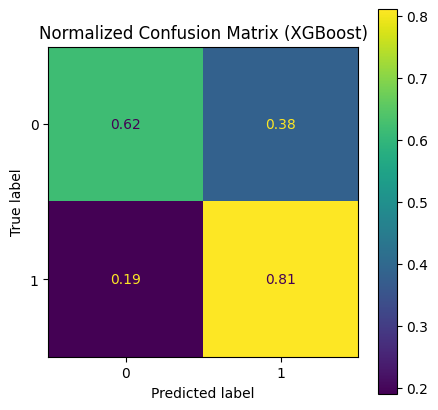

In [ ]:
from xgboost import XGBClassifier

# Define and train the XGBoost model with specified parameters
best_xgb = XGBClassifier(
    colsample_bytree=1,
    learning_rate=0.1,
    max_depth=5,
    n_estimators=100,
    subsample=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)
best_xgb.fit(X_train, y_train)

# Evaluate the best XGBoost model on the test set
y_pred_xgb = best_xgb.predict(X_test)
y_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

# Compute metrics
precision_xgb, recall_xgb, f1_xgb, _ = precision_recall_fscore_support(
    y_test, y_pred_xgb, average="binary"
)
auc_roc_xgb = roc_auc_score(y_test, y_proba_xgb)
logloss_xgb = log_loss(y_test, y_proba_xgb)
cm_xgb = confusion_matrix(y_test, y_pred_xgb, normalize="true")

# Print evaluation metrics
print("\nXGBoost Metrics:")
print(f"Precision: {precision_xgb:.2f}")
print(f"Recall (Sensitivity): {recall_xgb:.2f}")
print(f"F1 Score: {f1_xgb:.2f}")
print(f"AUC-ROC: {auc_roc_xgb:.2f}")
print(f"Log Loss: {logloss_xgb:.2f}")
print(f"Normalized Confusion Matrix: {cm_xgb}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb, display_labels=[0, 1])
cmd_xgb.plot(ax=ax)
plt.title("Normalized Confusion Matrix (XGBoost)")
plt.show()


# Playmaking Stats

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    confusion_matrix, classification_report, roc_auc_score, precision_score,
    recall_score, f1_score, roc_curve
)
import matplotlib.pyplot as plt

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(playmake_X, y, test_size=0.2, random_state=42, stratify=y)

## Supervised Modeling

### Logistec Regression

In [ ]:
# Initialize and train the logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Evaluate the model
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)


In [ ]:
# Add constant for intercept
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Train logistic regression model using statsmodels
logit_model = sm.Logit(y_train, X_train_sm).fit()

# Print model summary
print(logit_model.summary())

# Make predictions on test data
y_pred_sm = logit_model.predict(X_test_sm)
y_pred_class = (y_pred_sm > 0.5).astype(int)  # Convert probabilities to binary outcomes



Optimization terminated successfully.
         Current function value: 0.657575
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    WIN   No. Observations:                 2212
Model:                          Logit   Df Residuals:                     2137
Method:                           MLE   Df Model:                           74
Date:                Sun, 15 Dec 2024   Pseudo R-squ.:                 0.02779
Time:                        23:12:27   Log-Likelihood:                -1454.6
converged:                       True   LL-Null:                       -1496.1
Covariance Type:            nonrobust   LLR p-value:                    0.2180
                                                      coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
const                             

### Decision Trees

In [ ]:
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_auc_score,
    log_loss,
)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Define the decision tree classifier and the hyperparameter grid
decision_tree = DecisionTreeClassifier(random_state=42)
param_grid = {
    "max_depth": [3,4,5,6,7,8,9,10, None],
    "min_samples_split": [2,3,4,5, 10],
    "min_samples_leaf": [1, 2, 3, 4],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search = GridSearchCV(
    estimator=decision_tree,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search.fit(X_train, y_train)

# Extract the best model
best_tree = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")


Fitting 5 folds for each of 360 candidates, totalling 1800 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the Random Forest classifier and hyperparameter grid
rf_classifier = RandomForestClassifier(random_state=42)
param_grid_rf = {
    "n_estimators": [20,30, 40, 50, 100, 200],
    "max_depth": [5, 10, 15, 20, None],
    "min_samples_split": [2, 3, 4, 5, 10],
    "min_samples_leaf": [1, 2, 4, 6],
    "criterion": ["gini", "entropy"],
}

# Perform GridSearchCV
grid_search_rf_model = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid_rf,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_rf_model.fit(X_train, y_train)

# Extract the best model and parameters
best_rf_model = grid_search_rf_model.best_estimator_
best_rf_params = grid_search_rf_model.best_params_
print(f"Best Parameters: {best_rf_params}")


Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
Best Parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


### XGBoost

In [ ]:
import xgboost as xgb

# Define the XGBoost classifier and hyperparameter grid
xgb_classifier = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")
param_grid_xgb = {
    "n_estimators": [20,30,40],
    "max_depth": [3, 5],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

# Perform GridSearchCV
grid_search_xgb = GridSearchCV(
    estimator=xgb_classifier,
    param_grid=param_grid_xgb,
    scoring="roc_auc",
    cv=5,
    verbose=1,
)
grid_search_xgb.fit(X_train, y_train)

# Extract the best model and parameters
best_xgb = grid_search_xgb.best_estimator_
best_xgb_params = grid_search_xgb.best_params_
print(f"Best Parameters: {best_xgb_params}")

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 30, 'subsample': 0.8}


## Model Evaluation

### Logistic Regression


Metrics:
Precision: 0.58
Recall (Sensitivity): 0.83
F1 Score: 0.68
AUC-ROC: 0.49
Log Loss: 0.70
Normalized Confusion Matrix: [[0.14977974 0.85022026]
 [0.17431193 0.82568807]]


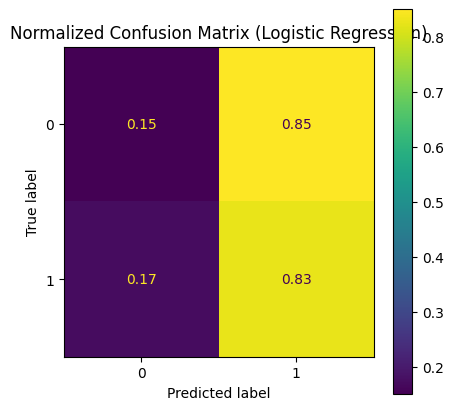

In [ ]:

# Evaluate the model
precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred_class, average="binary")
auc_roc = roc_auc_score(y_test, y_pred_sm)
logloss = log_loss(y_test, y_pred_sm)
cm = confusion_matrix(y_test, y_pred_class, normalize="true")

# Print evaluation metrics
print("\nMetrics:")
print(f"Precision: {precision:.2f}")
print(f"Recall (Sensitivity): {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"AUC-ROC: {auc_roc:.2f}")
print(f"Log Loss: {logloss:.2f}")
print(f"Normalized Confusion Matrix: {cm}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
cmd.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Logistic Regression)")
plt.show()

Confusion Matrix:
[[ 29 198]
 [ 49 278]]

Classification Report:
              precision    recall  f1-score   support

           0       0.37      0.13      0.19       227
           1       0.58      0.85      0.69       327

    accuracy                           0.55       554
   macro avg       0.48      0.49      0.44       554
weighted avg       0.50      0.55      0.49       554

F1 Score: 0.68
ROC AUC Score: 0.50
Precision: 0.58
Recall: 0.83


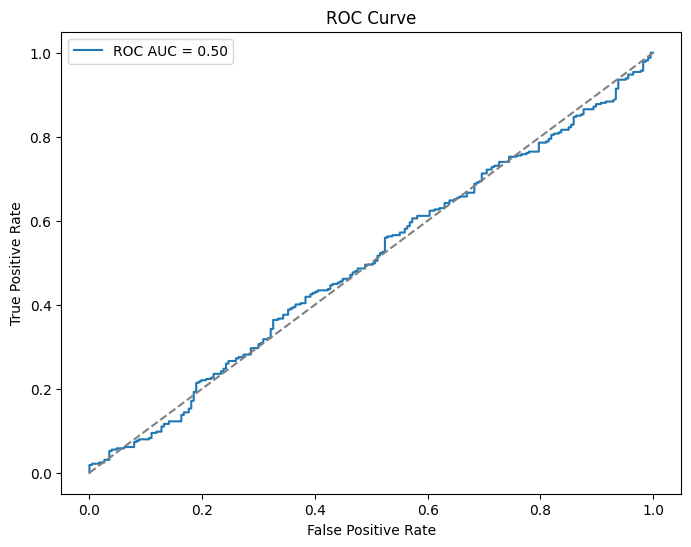

In [ ]:
# Print evaluation metrics
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"F1 Score: {f1:.2f}")
print(f"ROC AUC Score: {roc_auc:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Extract feature names and their corresponding coefficients
coefficients = pd.DataFrame({
    'Feature': playmake_X.columns,
    'Coefficient': model.coef_[0],
    'Importance': abs(model.coef_[0])
})

# Sort features by importance
coefficients = coefficients.sort_values(by='Importance', ascending=False)

coefficients

,Feature,Coefficient,Importance
45,LINEUPS_L. James - A. Reaves - M. Christie,-0.620545,0.620545
67,LINEUPS_S. Dinwiddie - R. Hachimura - A. Reaves,0.603883,0.603883
27,LINEUPS_D. Russell - C. Wood - T. Prince,0.558920,0.558920
24,LINEUPS_C. Wood - T. Prince - A. Reaves,-0.491875,0.491875
54,LINEUPS_L. James - D. Russell - R. Hachimura,0.439384,0.439384
68,LINEUPS_T. Prince - A. Reaves - M. Christie,-0.432873,0.432873
44,LINEUPS_L. James - A. Davis - T. Prince,0.413116,0.413116
25,LINEUPS_D. Russell - C. Reddish - A. Reaves,-0.413009,0.413009
3,AST RATIO,0.409778,0.409778
50,LINEUPS_L. James - D. Russell - C. Reddish,0.409196,0.409196


### Decision Trees

Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


Decision Tree Metrics:
Precision: 0.68
Recall (Sensitivity): 0.69
F1 Score: 0.69
AUC-ROC: 0.68
Log Loss: 3.35
Normalized Confusion Matrix: [[0.53744493 0.46255507]
 [0.3088685  0.6911315 ]]


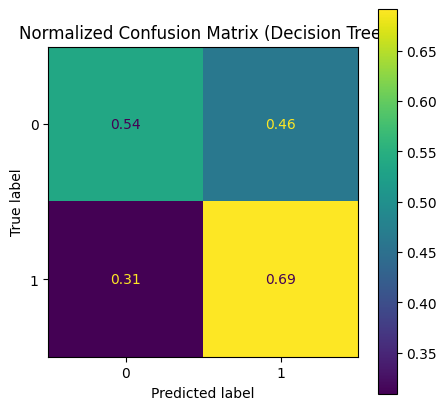

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, log_loss, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define and train the Decision Tree with the specified hyperparameters
best_tree = DecisionTreeClassifier(
    criterion='entropy',
    max_depth=None,
    min_samples_leaf=4,
    min_samples_split=10,
    random_state=42
)
best_tree.fit(X_train, y_train)

# Evaluate the best model on the test set
y_pred_tree = best_tree.predict(X_test)
y_proba_tree = best_tree.predict_proba(X_test)[:, 1]

# Compute metrics
precision_tree, recall_tree, f1_tree, _ = precision_recall_fscore_support(
    y_test, y_pred_tree, average="binary"
)
auc_roc_tree = roc_auc_score(y_test, y_proba_tree)
logloss_tree = log_loss(y_test, y_proba_tree)
cm_tree = confusion_matrix(y_test, y_pred_tree, normalize="true")

# Print evaluation metrics
print("\nDecision Tree Metrics:")
print(f"Precision: {precision_tree:.2f}")
print(f"Recall (Sensitivity): {recall_tree:.2f}")
print(f"F1 Score: {f1_tree:.2f}")
print(f"AUC-ROC: {auc_roc_tree:.2f}")
print(f"Log Loss: {logloss_tree:.2f}")
print(f"Normalized Confusion Matrix: {cm_tree}")

# Display the normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_tree = ConfusionMatrixDisplay(confusion_matrix=cm_tree, display_labels=[0, 1])
cmd_tree.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Decision Tree)")
plt.show()


### Random Forest

Best Parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}



Random Forest Metrics:
Precision: 0.68
Recall (Sensitivity): 0.78
F1 Score: 0.73
AUC-ROC: 0.65
Log Loss: 0.68
Normalized Confusion Matrix: [[0.46696035 0.53303965]
 [0.21712538 0.78287462]]


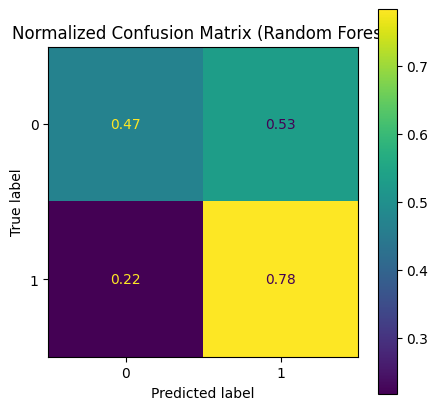


Top Features:
                                         Feature  Importance
3                                      AST RATIO    0.168644
0                                            MIN    0.146816
1                                           AST%    0.130486
2                                         AST/TO    0.107477
4                                       TO RATIO    0.050359
19      LINEUPS_A. Davis - T. Prince - A. Reaves    0.009642
72  LINEUPS_T. Prince - R. Hachimura - A. Reaves    0.008321
55     LINEUPS_L. James - D. Russell - T. Prince    0.008073
33    LINEUPS_D. Russell - T. Prince - A. Reaves    0.007998
59      LINEUPS_L. James - T. Prince - A. Reaves    0.007661


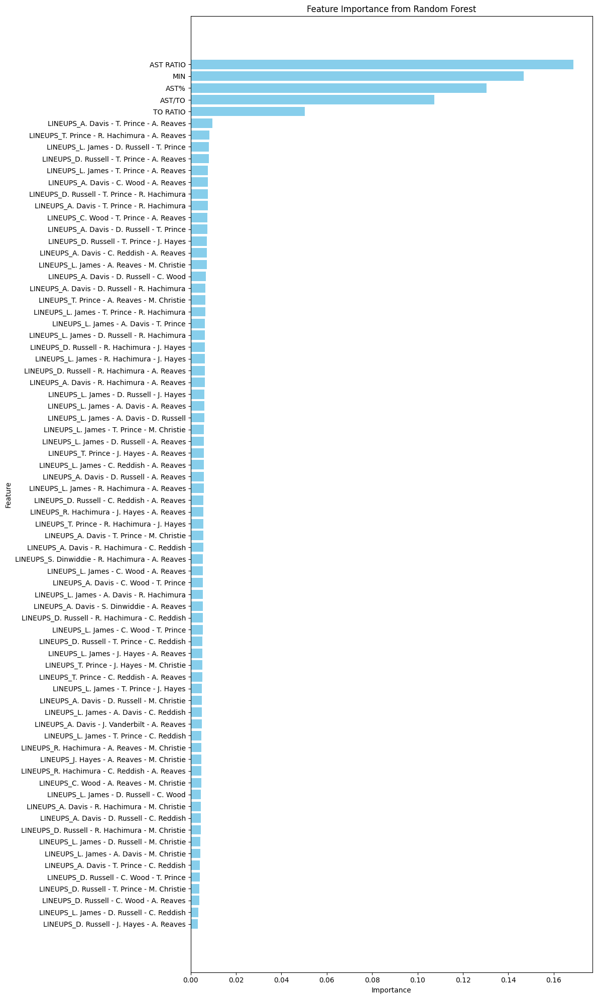

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Define and train the Random Forest model with specified parameters
best_rf_model = RandomForestClassifier(
    criterion='gini',
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=100,
    random_state=42
)
best_rf_model.fit(X_train, y_train)

# Evaluate the best Random Forest model on the test set
y_pred_rf_model = best_rf_model.predict(X_test)
y_proba_rf_model = best_rf_model.predict_proba(X_test)[:, 1]

# Compute metrics
precision_rf_model, recall_rf_model, f1_rf_model, _ = precision_recall_fscore_support(
    y_test, y_pred_rf_model, average="binary"
)
auc_roc_rf_model = roc_auc_score(y_test, y_proba_rf_model)
logloss_rf_model = log_loss(y_test, y_proba_rf_model)
cm_rf_model = confusion_matrix(y_test, y_pred_rf_model, normalize="true")

# Print evaluation metrics
print("\nRandom Forest Metrics:")
print(f"Precision: {precision_rf_model:.2f}")
print(f"Recall (Sensitivity): {recall_rf_model:.2f}")
print(f"F1 Score: {f1_rf_model:.2f}")
print(f"AUC-ROC: {auc_roc_rf_model:.2f}")
print(f"Log Loss: {logloss_rf_model:.2f}")
print(f"Normalized Confusion Matrix: {cm_rf_model}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_rf_model = ConfusionMatrixDisplay(confusion_matrix=cm_rf_model, display_labels=[0, 1])
cmd_rf_model.plot(ax=ax)
plt.title("Normalized Confusion Matrix (Random Forest)")
plt.show()

# Feature Importance
feature_importance = best_rf_model.feature_importances_
features = X_train.columns  # Assuming X_train is a DataFrame

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": feature_importance
}).sort_values(by="Importance", ascending=False)

# Print the top features
print("\nTop Features:")
print(importance_df.head(10))

# Plot feature importance
plt.figure(figsize=(12, 20))
plt.barh(importance_df["Feature"], importance_df["Importance"], color="skyblue")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance from Random Forest")
plt.gca().invert_yaxis()  # Show most important features at the top
plt.tight_layout()
plt.show()

### XGBoost

Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 30, 'subsample': 0.8}


XGBoost Metrics:
Precision: 0.64
Recall (Sensitivity): 0.81
F1 Score: 0.72
AUC-ROC: 0.65
Log Loss: 0.64
Normalized Confusion Matrix: [[0.35682819 0.64317181]
 [0.19266055 0.80733945]]


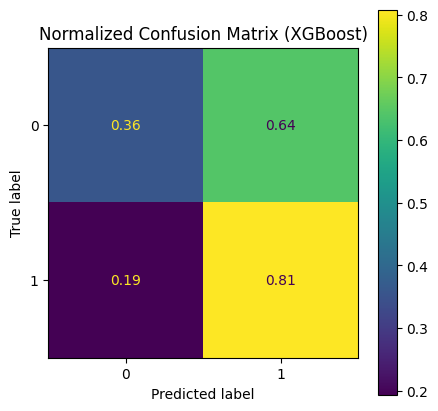

In [ ]:
from xgboost import XGBClassifier

# Define and train the XGBoost model with specified parameters
best_xgb = XGBClassifier(
    colsample_bytree=1,
    learning_rate=0.1,
    max_depth=5,
    n_estimators=40,
    subsample=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)
best_xgb.fit(X_train, y_train)

# Evaluate the best XGBoost model on the test set
y_pred_xgb = best_xgb.predict(X_test)
y_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

# Compute metrics
precision_xgb, recall_xgb, f1_xgb, _ = precision_recall_fscore_support(
    y_test, y_pred_xgb, average="binary"
)
auc_roc_xgb = roc_auc_score(y_test, y_proba_xgb)
logloss_xgb = log_loss(y_test, y_proba_xgb)
cm_xgb = confusion_matrix(y_test, y_pred_xgb, normalize="true")

# Print evaluation metrics
print("\nXGBoost Metrics:")
print(f"Precision: {precision_xgb:.2f}")
print(f"Recall (Sensitivity): {recall_xgb:.2f}")
print(f"F1 Score: {f1_xgb:.2f}")
print(f"AUC-ROC: {auc_roc_xgb:.2f}")
print(f"Log Loss: {logloss_xgb:.2f}")
print(f"Normalized Confusion Matrix: {cm_xgb}")

# Display normalized confusion matrix
fig, ax = plt.subplots(figsize=(5, 5))
cmd_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb, display_labels=[0, 1])
cmd_xgb.plot(ax=ax)
plt.title("Normalized Confusion Matrix (XGBoost)")
plt.show()


# EXTRA

In [ ]:
# Updated model comparison DataFrame with all metrics rounded to 3 decimals
model_comparison = pd.DataFrame({
    "Model": [
        "Logistic Regression",
        "Decision Tree",
        "Random Forest",
        "LightGBM",
        "XGBoost",
        "Neural Network"
    ],
    "Precision": [
        round(precision, 3),
        round(precision_tree, 3),
        round(precision_rf_model, 3),
        round(precision_xgb, 3)
    ],
    "Recall": [
        round(recall, 3),
        round(recall_tree, 3),
        round(recall_rf_model, 3),
        round(recall_xgb, 3)
    ],
    "F1 Score": [
        round(f1, 3),
        round(f1_tree, 3),
        round(f1_rf_model, 3)
        round(f1_xgb, 3)
    ],
    "AUC-ROC": [
        round(auc_roc, 3),
        round(auc_roc_tree, 3),
        round(auc_roc_rf_model, 3)
        round(auc_roc_xgb, 3)
    ],
    "Log Loss": [
        round(logloss, 3),
        round(logloss_tree, 3),
        round(logloss_rf_model, 3)
        round(logloss_xgb, 3)
    ]
})

# Display the updated DataFrame
print(model_comparison)


In [ ]:
!pip install shap
import shap
import matplotlib.pyplot as plt


In [ ]:
# Initialize the SHAP explainer
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values
shap_values = explainer(X_test)

# Visualizations
# 1. Summary Plot
shap.summary_plot(shap_values, X_test)

# 2. Force Plot for the first prediction
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test.iloc[0])

# 3. Bar Plot for feature importance
shap.plots.bar(shap_values)

# 4. Dependence Plot for a specific feature
shap.dependence_plot('GP', shap_values.values, X_test)


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    log_loss,
    confusion_matrix,
    ConfusionMatrixDisplay
)
import matplotlib.pyplot as plt

# Logistic Regression with L1 Regularization (Lasso)
lasso_model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000, random_state=42)
lasso_model.fit(X_train, y_train)
y_pred_lasso = lasso_model.predict(X_test)
y_pred_prob_lasso = lasso_model.predict_proba(X_test)[:, 1]

# Logistic Regression with L2 Regularization (Ridge)
ridge_model = LogisticRegression(penalty='l2', solver='liblinear', max_iter=1000, random_state=42)
ridge_model.fit(X_train, y_train)
y_pred_ridge = ridge_model.predict(X_test)
y_pred_prob_ridge = ridge_model.predict_proba(X_test)[:, 1]

# Evaluate L1 and L2 models
def evaluate_model(y_test, y_pred, y_pred_prob, model_name):
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc_roc = roc_auc_score(y_test, y_pred_prob)
    logloss = log_loss(y_test, y_pred_prob)
    cm = confusion_matrix(y_test, y_pred, normalize="true")

    print(f"\n{model_name} Metrics:")
    print(f"Precision: {precision:.2f}")
    print(f"Recall (Sensitivity): {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print(f"AUC-ROC: {auc_roc:.2f}")
    print(f"Log Loss: {logloss:.2f}")
    print(f"Normalized Confusion Matrix: \n{cm}")

    # Display normalized confusion matrix
    fig, ax = plt.subplots(figsize=(5, 5))
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
    cmd.plot(ax=ax)
    plt.title(f"Normalized Confusion Matrix ({model_name})")
    plt.show()

evaluate_model(y_test, y_pred_lasso, y_pred_prob_lasso, "Lasso (L1)")
evaluate_model(y_test, y_pred_ridge, y_pred_prob_ridge, "Ridge (L2)")
